# Paleo Final Project

In [1]:
# Basic packages
import numpy as np
from matplotlib import pyplot as plt
import xarray as xr
import pandas as pd
import math
import netCDF4 as nc

# DateTime packages
from matplotlib.dates import DateFormatter
from datetime import datetime, timedelta
import time
import matplotlib.dates as mdates

# Stats packages
import scipy
import bottleneck as bn
import PyCO2SYS as pyco2
import gsw
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
import statsmodels.api as sm
import seaborn as sns

# Logistical packages
import requests
from importlib import reload
import warnings
warnings.filterwarnings('ignore')

import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.offsetbox import AnchoredText

In [2]:
import pyleoclim as pyleo

# Preprocess all the data
Climate Reanalysis (SST and NINO34)
* Tardif, R., G.J. Hakim, W.A. Perkins, K.A. Horlick, M.P. Erb, J. Emile-Geay, D.M. Anderson, E.J. Steig, and D. Noone. 2019. Last Millennium Reanalysis with an expanded proxy database and seasonal proxy modeling. Climate of the Past, 15, 1251-1273. doi: 10.5194/cp-15-1251-2019
* https://www.ncei.noaa.gov/pub/data/paleo/reconstructions/tardif2019lmr/v2_1/
* Yang, W., Wallace, E., Vecchi, G.A. et al. Last millennium hurricane activity linked to endogenous climate variability. Nat Commun 15, 816 (2024). https://doi.org/10.1038/s41467-024-45112-6

Hurricanes
* Github data: https://github.com/wy2136/LastMillenniumHurricanes/tree/v1.0.0?tab=readme-ov-file, https://github.com/wy2136/LastMillenniumHurricanes/blob/v1.0.0/LMHU/fig_lines_sedimentHUcount.nc
* Paper link: https://www.nature.com/articles/s41467-024-45112-6#Sec8
* Yang, W., Wallace, E., Vecchi, G.A. et al. Last millennium hurricane activity linked to endogenous climate variability. Nat Commun 15, 816 (2024). https://doi.org/10.1038/s41467-024-45112-6

Alkenone SSTs
* San Lazaro Basin (SLB) at 25° 10'N, 112° 45'W
* https://doi.pangaea.de/10.1594/PANGAEA.909404?format=html#download
* O'Mara, Nicholas A; Cheung, Anson H; Kelly, Christopher S; Sandwick, Samantha; Herbert, Timothy D; Russell, James M; Abella-Gutiérrez, Jose; Dee, Sylvia G; Swarzenski, Peter W; Herguera, Juan-Carlos (2019): An 1800-year alkenone-based reconstruction of sea surface temperature from the San Lazaro (Soledad) Basin Baja California, Mexico [dataset]. PANGAEA, https://doi.org/10.1594/PANGAEA.909404, Supplement to: O'Mara, Nicholas A; Cheung, Anson H; Kelly, Christopher S; Sandwick, Samantha; Herbert, Timothy D; Russell, James M; Abella-Gutiérrez, Jose; Dee, Sylvia G; Swarzenski, Peter W; Herguera, Juan Carlos (2019): Subtropical Pacific Ocean Temperature Fluctuations in the Common Era: Multidecadal Variability and Its Relationship With Southwestern North American Megadroughts. Geophysical Research Letters, 46(24), 14662-14673, https://doi.org/10.1029/2019GL084828

Alkenone SSTs (Peru)
* Latitude: -44.150500 
* Longitude: -75.150833
* Collins, James A; Lamy, Frank; Kaiser, Jérôme; Ruggieri, Nicoletta; Henkel, Susann; De Pol-Holz, Ricardo; Garreaud, René D; Arz, Helge Wolfgang (2018): Alkenone sea surface temperature over the past 2300 years from sediment core MD07-3093 [dataset]. PANGAEA, https://doi.org/10.1594/PANGAEA.893140, In supplement to: Collins, JA et al. (2019): Centennial-scale SE Pacific sea surface temperature variability over the past 2300 years. Paleoceanography and Paleoclimatology, https://doi.org/10.1029/2018PA003465
* https://doi.pangaea.de/10.1594/PANGAEA.893140?format=html#download

Coral SST Proxies
* Clipperton Atoll
* Wu, Henry C; Moreau, Mélanie; Linsley, Braddock K; Schrag, Daniel P; Corrège, Thierry (2018): Clipperton Atoll replicated coral Sr/Ca-SST and reconstructed δ¹⁸O of seawater composite (1874-1994 CE) [dataset]. PANGAEA, https://doi.org/10.1594/PANGAEA.887712, Supplement to: Wu, HC et al. (2014): Investigation of sea surface temperature changes from replicated coral Sr/Ca variations in the eastern equatorial Pacific (Clipperton Atoll) since 1874. Palaeogeography, Palaeoclimatology, Palaeoecology, 412, 208-222, https://doi.org/10.1016/j.palaeo.2014.07.039
* https://doi.pangaea.de/10.1594/PANGAEA.887712
* Latitude: 10.300000 
* Longitude: -109.216660

Coral Proxy New Caledonia
* https://doi.pangaea.de/10.1594/PANGAEA.859256?format=html#download
* Quinn, Terrence Michael; Crowley, Thomas J; Taylor, Frederick W; Henin, Christian M; Joannot, Pascale; Join, Yvan (1998): Stable isotopic composition of Poritres lutea from New Caledonia [dataset]. PANGAEA, https://doi.org/10.1594/PANGAEA.859256, Supplement to: Quinn, TM et al. (1998): A multicentury stable isotope record from a New Caledonia coral: Interannual and decadal sea surface temperature variability in the southwest Pacific since 1657 A.D. Paleoceanography, 13(4), 412-426, https://doi.org/10.1029/98PA00401
* Latitude: -22.480000 * Longitude: 166.470000

## LMR SST and El Nino Index

In [3]:
df = xr.open_dataset("/Users/akbaskind/Desktop/Paleo/sst_MCruns_ensemble_mean_LMRv2.1.nc")

In [4]:
x1 = 190
x2 = 240
y1 = -5
y2 = 5
df = df.sel(lon = slice(x1,x2), lat = slice(y1,y2)).mean('MCrun')
LMRsst = df.mean('lat').mean('lon')
LMRsst

<xarray.Dataset>
Dimensions:  (time: 2001)
Coordinates:
  * time     (time) object 0000-01-01 00:00:00 ... 2000-01-01 00:00:00
Data variables:
    sst      (time) float32 -0.04858 -0.03702 -0.0208 ... 0.373 -0.6038 -0.1105

In [5]:
LMRdt = LMRsst['time'].dt.year

In [6]:
LMRsst['time']

<xarray.DataArray 'time' (time: 2001)>
array([cftime.DatetimeNoLeap(0, 1, 1, 0, 0, 0, 0, has_year_zero=True),
       cftime.DatetimeNoLeap(1, 1, 1, 0, 0, 0, 0, has_year_zero=True),
       cftime.DatetimeNoLeap(2, 1, 1, 0, 0, 0, 0, has_year_zero=True), ...,
       cftime.DatetimeNoLeap(1998, 1, 1, 0, 0, 0, 0, has_year_zero=True),
       cftime.DatetimeNoLeap(1999, 1, 1, 0, 0, 0, 0, has_year_zero=True),
       cftime.DatetimeNoLeap(2000, 1, 1, 0, 0, 0, 0, has_year_zero=True)],
      dtype=object)
Coordinates:
  * time     (time) object 0000-01-01 00:00:00 ... 2000-01-01 00:00:00
Attributes:
    description:    time
    long_name:      Time
    standard_name:  time
    actual_range:   [     0. 730000.]

In [7]:
df_i = xr.open_dataset("/Users/akbaskind/Desktop/Paleo/posterior_climate_indices_MCruns_ensemble_full_LMRv2.1.nc")
nino34 = df_i['nino34'].mean(['MCrun', 'members'])
nino34

<xarray.DataArray 'nino34' (time: 2001)>
array([ 0.03357775,  0.04513131,  0.0613529 , ...,  0.45508975,
       -0.5217114 , -0.02842741], dtype=float32)
Coordinates:
  * time     (time) object 0000-01-01 00:00:00 ... 2000-01-01 00:00:00

In [8]:
pdo = df_i['pdo'].mean(['MCrun', 'members'])
nao = df_i['nao'].mean(['MCrun', 'members'])
amo = df_i['amo'].mean(['MCrun', 'members'])

LMR_pdo = pyleo.Series(time=pdo['time'].dt.year, value=pdo,
                    time_name='Year', time_unit='yr', verbose=False,
                    value_name='Pacific Decadal Oscillation', value_unit='')

LMR_nao = pyleo.Series(time=nao['time'].dt.year, value=nao,
                    time_name='Year', time_unit='yr', verbose=False,
                    value_name='North Atlantic Oscillation', value_unit='')

LMR_amo = pyleo.Series(time=amo['time'].dt.year, value=amo,
                    time_name='Year', time_unit='yr', verbose=False,
                    value_name='Atlantic Multidecadal Oscillation', value_unit='')

In [9]:
LMR_SST = pyleo.Series(time=LMRdt, value=LMRsst['sst'],
                    time_name='Year', time_unit='yr', verbose=False,
                    value_name='SST', value_unit='°C')
LMR_nino = pyleo.Series(time=nino34['time'].dt.year, value=nino34,
                    time_name='Year', time_unit='yr', verbose=False,
                    value_name='NINO34', value_unit='unitless')
LMR_nino

{}


None
Time [yr]
0.0       0.033578
1.0       0.045131
2.0       0.061353
3.0       0.077442
4.0       0.071500
            ...   
1996.0    0.072445
1997.0    1.677664
1998.0    0.455090
1999.0   -0.521711
2000.0   -0.028427
Name: NINO34 [unitless], Length: 2001, dtype: float64

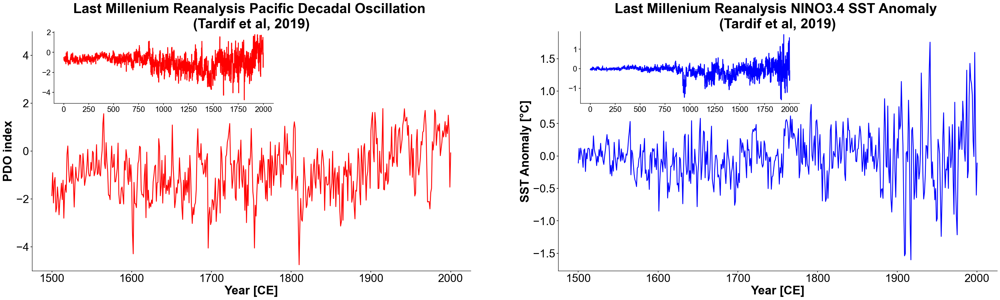

In [297]:
fig, axarr = plt.subplots(ncols = 2, figsize = [40,10])
axarr = axarr.flatten()
dat = LMR_pdo.sel(time=slice(1500, 2000))
ax = axarr[0]
ax.plot(dat.time, dat.value, c = 'r')
ax.set_ylim([-5,5])
ins = ax.inset_axes([0.05,0.7,0.5,0.3])
ins.plot(LMR_pdo.time, LMR_pdo.value, c = 'r')
ax.set_ylabel('PDO index', fontsize = 28, fontweight = 'bold')
ax.set_xlabel('Year [CE]', fontsize = 28, fontweight = 'bold')
ax.tick_params('x', labelsize = 26)
ax.tick_params('y', labelsize = 26)
ax.grid(False)
ins.grid(False)
ax.set_title('Last Millenium Reanalysis Pacific Decadal Oscillation \n(Tardif et al, 2019)', fontsize = 32, fontweight = 'bold')

dat = LMR_SST.sel(time=slice(1500, 2000))
ax = axarr[1]
ax.plot(dat.time, dat.value, c = 'b')
# ax.set_ylim([20,23.5])
ins = ax.inset_axes([0.05,0.7,0.5,0.3])
ins.plot(LMR_SST.time, LMR_SST.value, c = 'b')
ax.set_ylabel('SST Anomaly [°C]', fontsize = 28, fontweight = 'bold')
ax.set_xlabel('Year [CE]', fontsize = 28, fontweight = 'bold')
ax.tick_params('x', labelsize = 26)
ax.tick_params('y', labelsize = 26)
ax.grid(False)
ins.grid(False)
ax.set_title('Last Millenium Reanalysis NINO3.4 SST Anomaly \n(Tardif et al, 2019)', fontsize = 32, fontweight = 'bold')
fig.savefig('/Users/akbaskind/Desktop/Paleo/PDO_ENSO_ts.png', bbox_inches='tight')

## Hurricane Data

In [10]:
hu = xr.open_dataset("/Users/akbaskind/Desktop/Paleo/fig_lines_sedimentHUcount.nc")

In [11]:
total_hurricane = hu['sedimentHUcount'].isel(member = slice(3,15)).sum('member')
y1 = hu['sedimentHUcount'].isel(member = 3)
y2 = hu['sedimentHUcount'].isel(member = 4)
y3 = hu['sedimentHUcount'].isel(member = 5)
y4 = hu['sedimentHUcount'].isel(member = 6)
y5 = hu['sedimentHUcount'].isel(member = 7)
y6 = hu['sedimentHUcount'].isel(member = 8)
y7 = hu['sedimentHUcount'].isel(member = 9)
y8 = hu['sedimentHUcount'].isel(member = 10)
y9 = hu['sedimentHUcount'].isel(member = 11)
y10 = hu['sedimentHUcount'].isel(member = 12)
y11 = hu['sedimentHUcount'].isel(member = 13)
y12 = hu['sedimentHUcount'].isel(member = 14)
labs = hu['member'].isel(member = slice(3,15))
labs = ['Abaco and Grand Bahama ', 'South Andros Island, The Bahamas', 'Gulf Coast-Appalachee Bay, FL', 'Gulf Coast-Choctawhatchee Bay, FL',
        'Long Island, The Bahamas', 'Lighthouse Reef Belize', 'Mid-Atlantic', 'Middle Caicos', 'New England', 'Southeast US', 
        'Vieques, Puerto Rico', 'Yucatan']

In [12]:
hurr = pyleo.Series(time=hu['year'], value=total_hurricane,
                    time_name='Year', time_unit='yr', verbose=False,
                    value_name='Hurricane Count', value_unit='no.')

## SSTs

In [13]:
sst_ca = pd.read_csv('/Users/akbaskind/Desktop/Paleo/OMara2019SST.csv')
sst_peru = pd.read_csv('/Users/akbaskind/Desktop/Paleo/Collins2019.csv')

In [32]:
sst_peru

,Depth sed [m],Depth corr [m],Age [ka BP],SST (1-12) [¬∞C]
0,0.13,0.13,-0.0425,12.58
1,0.15,0.15,-0.0396,12.55
2,0.17,0.17,-0.0359,12.48
3,0.19,0.19,-0.0327,12.65
4,0.21,0.21,-0.0300,12.52
...,...,...,...,...
432,9.50,8.91,2.2826,13.43
433,9.52,8.93,2.2924,13.54
434,9.54,8.95,2.3012,13.62
435,9.56,8.97,2.3117,13.43


In [14]:
SSTca = pyleo.Series(time=sst_ca['Age [a AD/CE]'], value=sst_ca['SST (1-12) [¬∞C]'],
                    time_name='Year', time_unit='yr', verbose=False,
                    value_name='SST', value_unit='°C').interp(step = 1)
SSTperu = pyleo.Series(time=2000 - sst_peru['Age [ka BP]'] * 1000, value=sst_peru['SST (1-12) [¬∞C]'],
                    time_name='Year', time_unit='yr (referenced to 2000)', verbose=False,
                    value_name='SST', value_unit='°C').interp(step = 1)

In [35]:
SSTperu

{}


None
Time [yr (referenced to 2000)]
-322.1     13.330000
-321.1     13.339615
-320.1     13.349231
-319.1     13.358846
-318.1     13.368462
             ...    
 2037.9    12.517838
 2038.9    12.536757
 2039.9    12.553103
 2040.9    12.563448
 2041.9    12.573793
Name: SST [°C], Length: 2365, dtype: float64

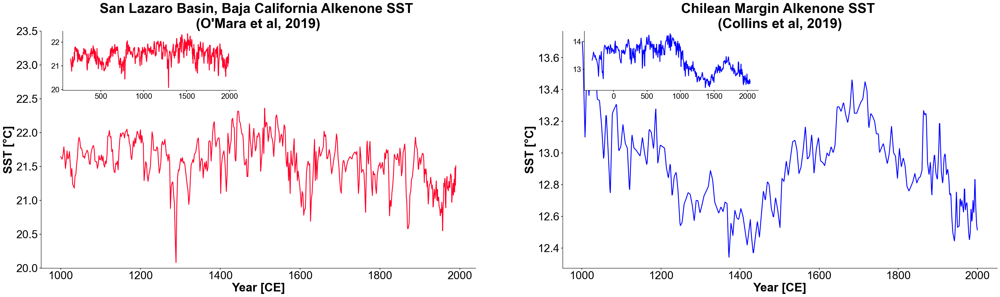

In [271]:
fig, axarr = plt.subplots(ncols = 2, figsize = [40,10])
axarr = axarr.flatten()
dat = SSTca.sel(time=slice(1000, 2000))
ax = axarr[0]
ax.plot(dat.time, dat.value)
ax.set_ylim([20,23.5])
ins = ax.inset_axes([0.05,0.75,0.4,0.25])
ins.plot(SSTca.time, SSTca.value)
ax.set_ylabel('SST [°C]', fontsize = 28, fontweight = 'bold')
ax.set_xlabel('Year [CE]', fontsize = 28, fontweight = 'bold')
ax.tick_params('x', labelsize = 26)
ax.tick_params('y', labelsize = 26)
ax.grid(False)
ins.grid(False)
ax.set_title('San Lazaro Basin, Baja California Alkenone SST \n(O\'Mara et al, 2019)', fontsize = 32, fontweight = 'bold')

dat = SSTperu.sel(time=slice(1000, 2000))
ax = axarr[1]
ax.plot(dat.time, dat.value, c = 'b')
# ax.set_ylim([20,23.5])
ins = ax.inset_axes([0.05,0.75,0.4,0.25])
ins.plot(SSTperu.time, SSTperu.value, c = 'b')
ax.set_ylabel('SST [°C]', fontsize = 28, fontweight = 'bold')
ax.set_xlabel('Year [CE]', fontsize = 28, fontweight = 'bold')
ax.tick_params('x', labelsize = 26)
ax.tick_params('y', labelsize = 26)
ax.grid(False)
ins.grid(False)
ax.set_title('Chilean Margin Alkenone SST \n(Collins et al, 2019)', fontsize = 32, fontweight = 'bold')
fig.savefig('/Users/akbaskind/Desktop/Paleo/AlkenoneSST_ts.png', bbox_inches='tight')

## SST coral proxy

In [15]:
coral = pd.read_csv('/Users/akbaskind/Desktop/Paleo/WU2014_coralSST.csv')

In [16]:
coralSrCa = pyleo.Series(time=coral['Age [a AD/CE]'], value=coral['P. lobata Sr/Ca anom [mmol/mol]'],
                    time_name='Year', time_unit='yr', verbose=False,
                    value_name='Sr/Ca Anom', value_unit='mmol/mol').interp(step = 1)
coralSrCa

{}


None
Time [yr]
1874.0833   -0.006000
1875.0833    0.030000
1876.0833    0.007000
1877.0833   -0.010000
1878.0833    0.036000
               ...   
1989.0833   -0.012513
1990.0833   -0.019029
1991.0833   -0.062523
1992.0833   -0.083499
1993.0833   -0.079002
Name: Sr/Ca Anom [mmol/mol], Length: 120, dtype: float64

## SST coral proxy New Caledonia

In [17]:
quinn = pd.read_csv('/Users/akbaskind/Desktop/Paleo/Quinn1998.csv')
quinn

,Age [a AD/CE],Age [ka BP],P. lutea d13C,P. lutea d18O
0,1992.75,-0.04275,-1.89,-4.25
1,1992.50,-0.04250,-1.63,-4.54
2,1992.25,-0.04225,-1.38,-4.74
3,1992.00,-0.04200,-1.36,-4.51
4,1991.75,-0.04175,-1.45,-4.17
...,...,...,...,...
1336,1658.75,0.29125,-0.69,-4.07
1337,1658.50,0.29150,-1.03,-4.10
1338,1658.25,0.29175,-0.98,-3.97
1339,1658.00,0.29200,-1.10,-3.67


In [18]:
corald180 = pyleo.Series(time=quinn['Age [a AD/CE]'], value=quinn['P. lutea d18O'],
                    time_name='Year', time_unit='yr', verbose=False,
                    value_name='d18O', value_unit='permil').interp(step = 1)
corald180

{}


None
Time [yr]
1657.75   -3.34
1658.75   -4.07
1659.75   -3.92
1660.75   -3.90
1661.75   -3.92
           ... 
1988.75   -4.20
1989.75   -4.26
1990.75   -4.19
1991.75   -4.17
1992.75   -4.25
Name: d18O [permil], Length: 336, dtype: float64

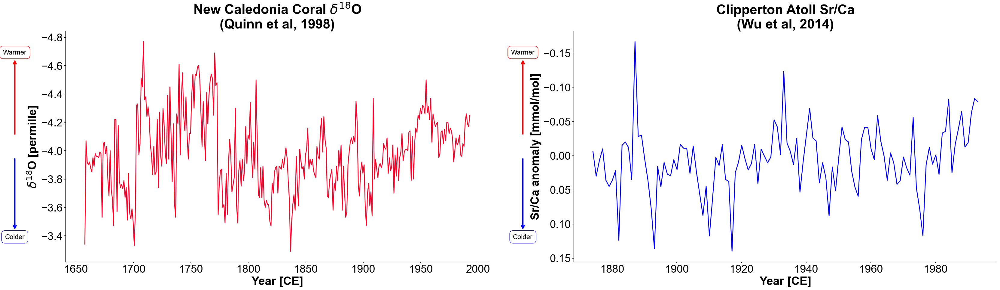

In [283]:
fig, axarr = plt.subplots(ncols = 2, figsize = [40,10])
axarr = axarr.flatten()

ax = axarr[0]
ax.plot(corald180.time, corald180.value)
ax.set_ylabel('$\delta^{18}$O [permille]', fontsize = 28, fontweight = 'bold')
ax.set_xlabel('Year [CE]', fontsize = 28, fontweight = 'bold')
ax.tick_params('x', labelsize = 26)
ax.tick_params('y', labelsize = 26)
ax.grid(False)
ax.invert_yaxis()
ax.set_title('New Caledonia Coral $\delta^{18}$O\n(Quinn et al, 1998)', fontsize = 32, fontweight = 'bold')
ax.annotate("Warmer",
            xy=(0.1 - 0.22, 0.55), xycoords = 'axes fraction',
            xytext=(0.1 - 0.22, 0.9), textcoords = 'axes fraction', horizontalalignment="center",
            arrowprops=dict(arrowstyle="<-", lw = 3, color = 'red'),
                            fontsize = 16,
            bbox=dict(facecolor='white', edgecolor='red', boxstyle='round,pad=0.5'))
ax.annotate("Colder",
            xy=(0.1 - 0.22, 0.45), xycoords = 'axes fraction',
            xytext=(0.1 - 0.22, 0.1), textcoords = 'axes fraction', horizontalalignment="center",
            arrowprops=dict(arrowstyle="<-", lw = 3, color = 'blue'),
            fontsize = 16,
            bbox=dict(facecolor='white', edgecolor='blue', boxstyle='round,pad=0.5'))


ax = axarr[1]
ax.plot(coralSrCa.time, coralSrCa.value, c = 'b')
# ax.set_ylim([20,23.5])
ax.set_ylabel('Sr/Ca anomaly [mmol/mol]', fontsize = 28, fontweight = 'bold')
ax.set_xlabel('Year [CE]', fontsize = 28, fontweight = 'bold')
ax.tick_params('x', labelsize = 26)
ax.tick_params('y', labelsize = 26)
ax.grid(False)
ax.invert_yaxis()
ax.set_title('Clipperton Atoll Sr/Ca\n(Wu et al, 2014)', fontsize = 32, fontweight = 'bold')
ax.annotate("Warmer",
            xy=(0.1 - 0.22, 0.55), xycoords = 'axes fraction',
            xytext=(0.1 - 0.22, 0.9), textcoords = 'axes fraction', horizontalalignment="center",
            arrowprops=dict(arrowstyle="<-", lw = 3, color = 'red'),
                            fontsize = 16,
            bbox=dict(facecolor='white', edgecolor='red', boxstyle='round,pad=0.5'))
ax.annotate("Colder",
            xy=(0.1 - 0.22, 0.45), xycoords = 'axes fraction',
            xytext=(0.1 - 0.22, 0.1), textcoords = 'axes fraction', horizontalalignment="center",
            arrowprops=dict(arrowstyle="<-", lw = 3, color = 'blue'),
            fontsize = 16,
            bbox=dict(facecolor='white', edgecolor='blue', boxstyle='round,pad=0.5'))
fig.savefig('/Users/akbaskind/Desktop/Paleo/SSTproxy_ts.png', bbox_inches='tight')

## Combine pyleoclim time series 

In [19]:
TS = [LMR_SST, LMR_nino, hurr, SSTca, SSTperu, coralSrCa, LMR_pdo, corald180]
ms = pyleo.MultipleSeries(TS, label='El Nino Teleconnections', time_unit='year CE')
ms

                     None
datetime                 
1657-09-30 06:07:14 -3.34
1658-09-30 11:56:00 -4.07
1659-09-30 17:44:46 -3.92
1660-09-29 23:33:32 -3.90
1661-09-30 05:22:18 -3.92
...                   ...
1988-09-30 10:08:51 -4.20
1989-09-30 15:57:37 -4.26
1990-09-30 21:46:23 -4.19
1991-10-01 03:35:09 -4.17
1992-09-30 09:23:55 -4.25

[336 rows x 1 columns]

In [23]:
len(TS)

8

In [24]:
temp = {'Year': TS[0].time, 'Nino SST': TS[0].value}
DF = pd.DataFrame(temp)
temp = {'Year': TS[2].time, 'Hurricane': TS[2].value}
DF2 = pd.DataFrame(temp)
DF = pd.merge_asof(DF, DF2, on="Year",tolerance = 1)
temp = {'Year': TS[3].time, 'Baja SST': TS[3].value}
DF2 = pd.DataFrame(temp)
DF = pd.merge_asof(DF, DF2, on="Year",tolerance = 1)
temp = {'Year': TS[4].time, 'Chile SST': TS[4].value}
DF2 = pd.DataFrame(temp)
DF = pd.merge_asof(DF, DF2, on="Year",tolerance = 1)
temp = {'Year': TS[5].time, 'Clipperton Sr/Ca': TS[5].value}
DF2 = pd.DataFrame(temp)
DF = pd.merge_asof(DF, DF2, on="Year",tolerance = 1)
temp = {'Year': TS[6].time, 'PDO': TS[6].value}
DF2 = pd.DataFrame(temp)
DF = pd.merge_asof(DF, DF2, on="Year",tolerance = 1)
temp = {'Year': TS[7].time, 'd18O': TS[7].value}
DF2 = pd.DataFrame(temp)
DF = pd.merge_asof(DF, DF2, on="Year",tolerance = 1)
temp = {'Year': TS[1].time, 'NINO3.4': TS[1].value}
DF2 = pd.DataFrame(temp)
DF = pd.merge_asof(DF, DF2, on="Year",tolerance = 1)
DF

,Year,Nino SST,Hurricane,Baja SST,Chile SST,Clipperton Sr/Ca,PDO,d18O,NINO3.4
0,0.0,-0.048576,NaN,NaN,13.664179,NaN,-0.502419,NaN,0.033578
1,1.0,-0.037017,NaN,NaN,13.646269,NaN,-0.783280,NaN,0.045131
2,2.0,-0.020796,NaN,NaN,13.628358,NaN,-0.731330,NaN,0.061353
3,3.0,-0.004708,NaN,NaN,13.610448,NaN,-0.595422,NaN,0.077442
4,4.0,-0.010646,NaN,NaN,13.592537,NaN,-0.800989,NaN,0.071500
...,...,...,...,...,...,...,...,...,...
1996,1996.0,-0.009671,61.439084,NaN,12.658696,NaN,0.729486,NaN,0.072445
1997,1997.0,1.595357,61.016753,NaN,12.605000,NaN,1.495693,NaN,1.677664
1998,1998.0,0.372951,60.448487,NaN,12.555000,NaN,0.838083,NaN,0.455090
1999,1999.0,-0.603788,59.736905,NaN,12.529706,NaN,-1.508050,NaN,-0.521711


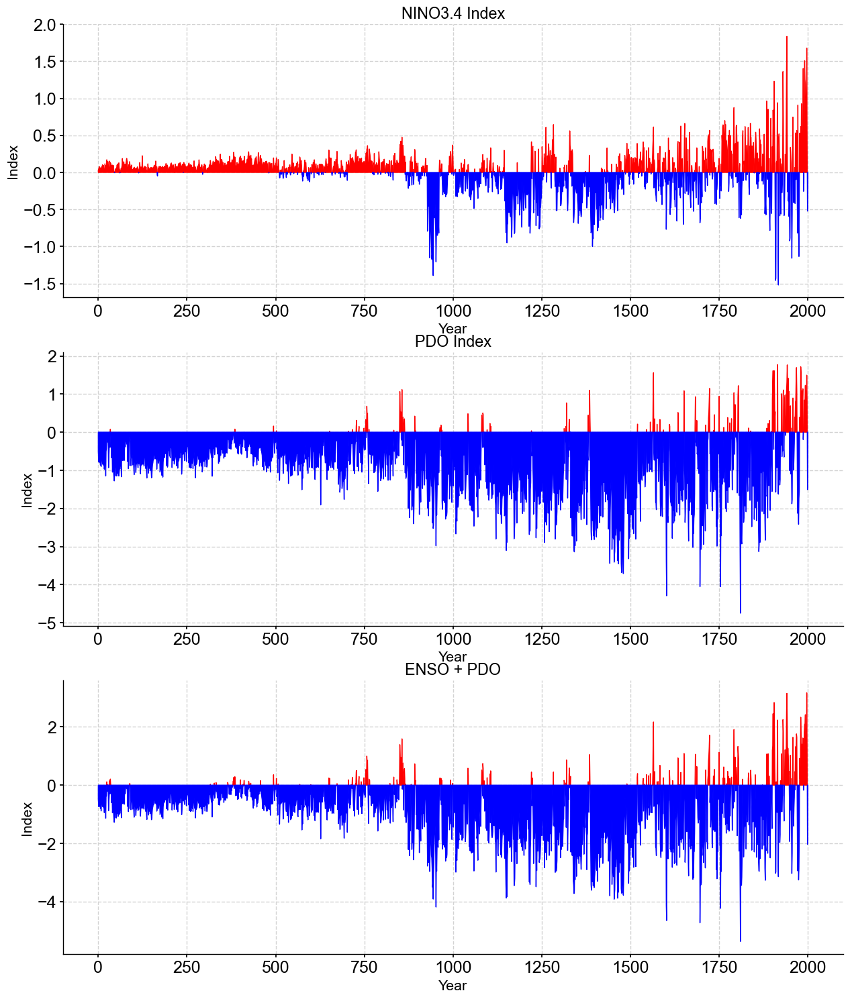

In [561]:
fig, axarr = plt.subplots(nrows = 3, figsize = [15,18])
axarr = axarr.flatten()

x = DF['Year']
y1 = DF['NINO3.4']
y2 = DF["PDO"]
ax = axarr[0]
# ax.plot(x,y1)
ax.fill_between(x, 0, y1, where=y1>0, color = 'r', interpolate=True)
ax.fill_between(x, y1, 0, where=y1<0, color = 'b', interpolate=True)
ax.set_title('NINO3.4 Index')

ax = axarr[1]
# ax.plot(x,y2)
ax.fill_between(x, 0, y2, where=y2>0, color = 'r', interpolate=True)
ax.fill_between(x, y2, 0, where=y2<0, color = 'b', interpolate=True)
ax.set_title('PDO Index')


ax = axarr[2]
Y = y1 + y2 
# ax.plot(x,Y)
ax.fill_between(x, 0, Y, where=Y>0, color = 'r', interpolate=True)
ax.fill_between(x, Y, 0, where=Y<0, color = 'b', interpolate=True)
ax.set_title('ENSO + PDO')

for ax in axarr:
    ax.set_xlabel('Year')
    ax.set_ylabel("Index")
# ax.plot(x, y2)
# ax.plot(DF['Year'],DF['NINO3.4'], label='NINO', color = c6, alpha = 0.5)

# ax.legend()
fig.savefig('/Users/akbaskind/Desktop/Paleo/period_ex2.png', bbox_inches='tight')

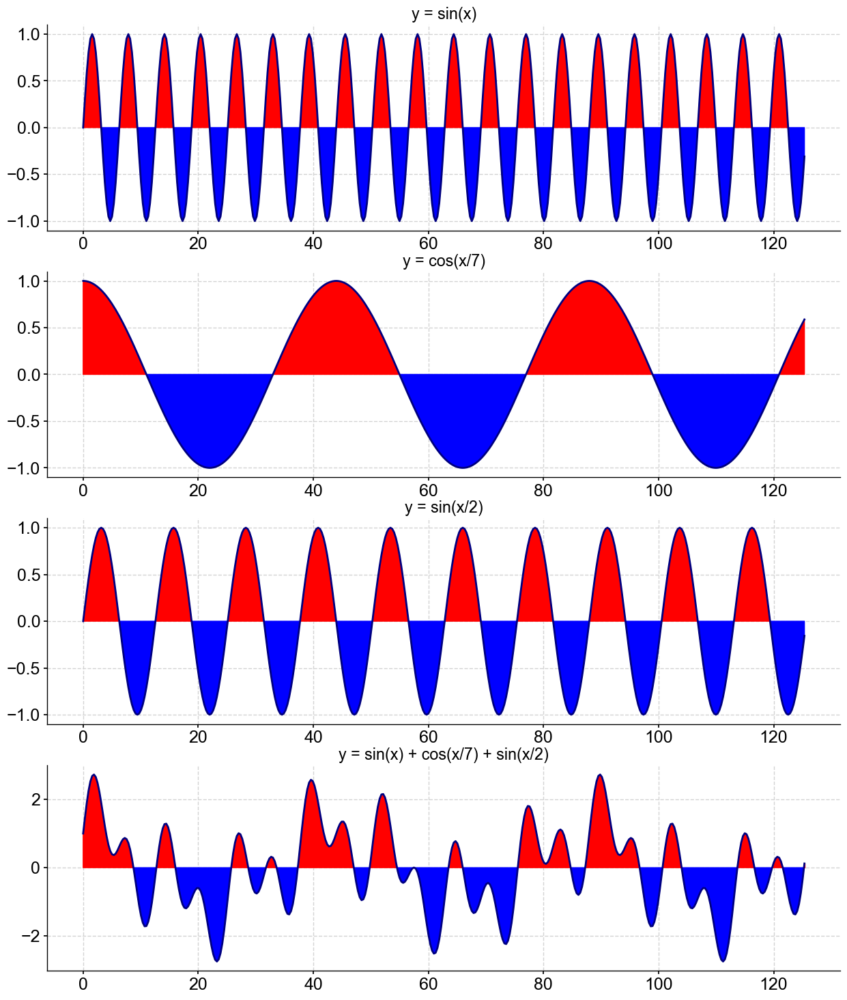

In [572]:
fig, axarr = plt.subplots(nrows = 4, figsize = [15,18])
axarr = axarr.flatten()

x = np.arange(0,np.pi*40, np.pi/10)
# a = np.random.uniform(low=0, high=1, size=(400))
a = 0.5
y = np.sin(x)
# b = np.random.uniform(low=0, high=1, size=(400))
b = 1
y2 = b*np.cos(x/7)
# c = np.random.uniform(low=0, high=1, size=(400))
c = 0.75
y3 = np.sin(x/2)

ax = axarr[0]
ax.plot(x,y)
ax.fill_between(x, 0, y, where=y>0, color = 'r', interpolate=True)
ax.fill_between(x, y, 0, where=y<0, color = 'b', interpolate=True)
ax.set_title('y = sin(x)')

ax = axarr[1]
ax.plot(x,y2)
ax.fill_between(x, 0, y2, where=y2>0, color = 'r', interpolate=True)
ax.fill_between(x, y2, 0, where=y2<0, color = 'b', interpolate=True)
ax.set_title('y = cos(x/7)')

ax = axarr[2]
ax.plot(x,y3)
ax.fill_between(x, 0, y3, where=y3>0, color = 'r', interpolate=True)
ax.fill_between(x, y3, 0, where=y3<0, color = 'b', interpolate=True)
ax.set_title('y = sin(x/2)')

ax = axarr[3]
Y = y + y2 + y3
ax.plot(x,Y)
ax.fill_between(x, 0, Y, where=Y>0, color = 'r', interpolate=True)
ax.fill_between(x, Y, 0, where=Y<0, color = 'b', interpolate=True)
ax.set_title('y = sin(x) + cos(x/7) + sin(x/2)')
# ax.plot(x, y2)
# ax.plot(DF['Year'],DF['NINO3.4'], label='NINO', color = c6, alpha = 0.5)

# ax.legend()
fig.savefig('/Users/akbaskind/Desktop/Paleo/period_ex.png', bbox_inches='tight')

Performing spectral analysis on individual series: 100%|██████████| 200/200 [00:01<00:00, 109.64it/s]
Performing spectral analysis on individual series: 100%|██████████| 200/200 [00:01<00:00, 107.97it/s]
Performing spectral analysis on individual series: 100%|██████████| 200/200 [00:01<00:00, 107.69it/s]


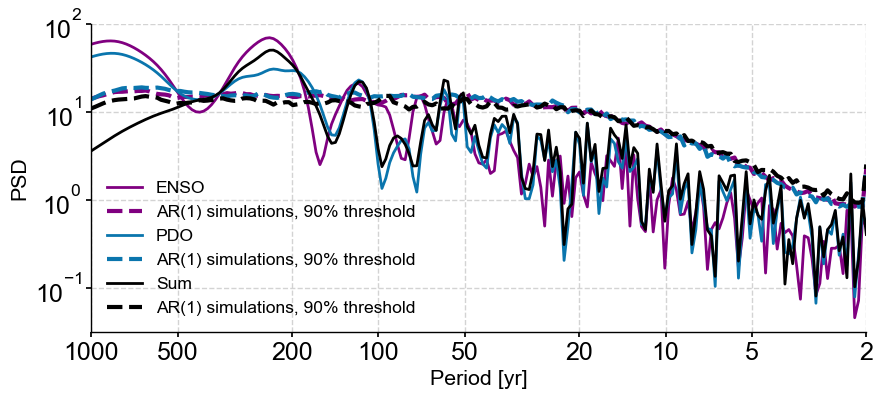

In [492]:
NINOPDO = pyleo.Series(time=DF['Year'], value=DF['NINO3.4']+DF['PDO'],
                    time_name='Year', time_unit='yr', verbose=False,
                    value_name='Summed NINO3.4 and PDO index', value_unit='none')
fig, ax = LMR_nino.detrend().spectral(method='lomb_scargle').signif_test(qs = [0.9]).plot(color = c6, signif_clr = c6, signif_linewidth = 3,
                                                                    label = 'ENSO')
LMR_pdo.detrend().spectral(method='lomb_scargle').signif_test(qs = [0.9]).plot(ax = ax,color = c4, signif_clr = c4, signif_linewidth = 3,
                                                                    label = 'PDO')
NINOPDO.detrend().spectral(method='lomb_scargle').signif_test(qs = [0.9]).plot(ax = ax, color = 'k', signif_clr = 'k', signif_linewidth = 3,
                                                                    label = 'Sum')
fig.savefig('/Users/akbaskind/Desktop/Paleo/PDOENSO_PSD_long.png', bbox_inches='tight')

In [458]:
# DF[DF['Nino SST'] > -0.1]
i = DF.index[DF['Year'] >= 0]
DF1500 = DF.loc[i]

In [456]:
DF1500[['Year', 'Nino SST', 'PDO']].dropna()

,Year,Nino SST,PDO
1000,1000.0,0.088179,-0.268652
1001,1001.0,-0.118676,-1.408625
1002,1002.0,-0.121267,-0.659408
1003,1003.0,-0.100113,-0.902629
1004,1004.0,-0.089748,-0.479570
...,...,...,...
1996,1996.0,-0.009671,0.729486
1997,1997.0,1.595357,1.495693
1998,1998.0,0.372951,0.838083
1999,1999.0,-0.603788,-1.508050


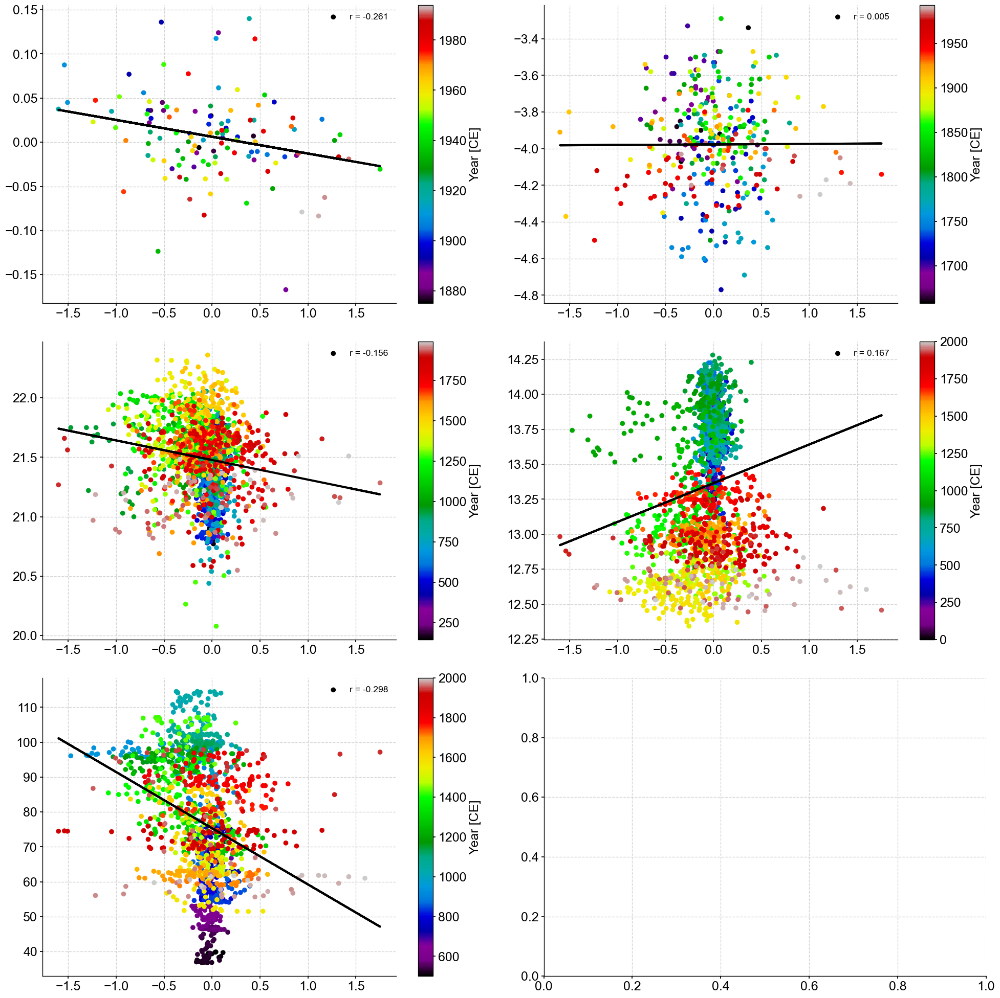

In [460]:
fig, axarr = plt.subplots(nrows = 3, ncols = 2, figsize = [20,20],tight_layout=True)
axarr = axarr.flatten()
fig.tight_layout(pad=300.0)
plt.rcParams["axes.prop_cycle"] = plt.cycler("color", plt.cm.jet(np.linspace(0,1,8)))
colors = plt.rcParams["axes.prop_cycle"]()

PDV = 'Nino SST'
ax = axarr[0]
data = DF1500[['Year', PDV, 'Clipperton Sr/Ca']].dropna()
r = np.corrcoef(data[PDV], data['Clipperton Sr/Ca'])
lbl = 'r = ' + str(round(r[0,1],3))
im = ax.scatter(data[PDV], data['Clipperton Sr/Ca'], c = data['Year'], cmap = 'nipy_spectral', label = lbl)
cbar = plt.colorbar(im, ax = ax)
cbar.set_label("Year [CE]", fontsize = 18)
xdata = np.asarray(data[PDV]).reshape(-1,1)
ydata = np.asarray(data['Clipperton Sr/Ca']).reshape(-1,1)
res = LinearRegression().fit(xdata, ydata)
y_pred = res.intercept_ + res.coef_ * xdata
ax.plot(xdata, y_pred, c = 'k', lw = 3)
ax.legend()

ax = axarr[1]
data = DF1500[['Year', PDV, 'd18O']].dropna()
r = np.corrcoef(data[PDV], data['d18O'])
lbl = 'r = ' + str(round(r[0,1],3))
im = ax.scatter(data[PDV], data['d18O'], c = data['Year'], cmap = 'nipy_spectral', label = lbl)
cbar = plt.colorbar(im, ax = ax)
cbar.set_label("Year [CE]", fontsize = 18)
xdata = np.asarray(data[PDV]).reshape(-1,1)
ydata = np.asarray(data['d18O']).reshape(-1,1)
res = LinearRegression().fit(xdata, ydata)
y_pred = res.intercept_ + res.coef_ * xdata
ax.plot(xdata, y_pred, c = 'k', lw = 3)
ax.legend()

ax = axarr[2]
data = DF1500[['Year', PDV, 'Baja SST']].dropna()
r = np.corrcoef(data[PDV], data['Baja SST'])
lbl = 'r = ' + str(round(r[0,1],3))
im = ax.scatter(data[PDV], data['Baja SST'], c = data['Year'], cmap = 'nipy_spectral', label = lbl)
cbar = plt.colorbar(im, ax = ax)
cbar.set_label("Year [CE]", fontsize = 18)
xdata = np.asarray(data[PDV]).reshape(-1,1)
ydata = np.asarray(data['Baja SST']).reshape(-1,1)
res = LinearRegression().fit(xdata, ydata)
y_pred = res.intercept_ + res.coef_ * xdata
ax.plot(xdata, y_pred, c = 'k', lw = 3)
ax.legend()

ax = axarr[3]
data = DF1500[['Year', PDV, 'Chile SST']].dropna()
r = np.corrcoef(data[PDV], data['Chile SST'])
lbl = 'r = ' + str(round(r[0,1],3))
im = ax.scatter(data[PDV], data['Chile SST'], c = data['Year'], cmap = 'nipy_spectral', label = lbl)
cbar = plt.colorbar(im, ax = ax)
cbar.set_label("Year [CE]", fontsize = 18)
xdata = np.asarray(data[PDV]).reshape(-1,1)
ydata = np.asarray(data['Chile SST']).reshape(-1,1)
res = LinearRegression().fit(xdata, ydata)
y_pred = res.intercept_ + res.coef_ * xdata
ax.plot(xdata, y_pred, c = 'k', lw = 3)
ax.legend()

ax = axarr[4]
data = DF1500[['Year', PDV, 'Hurricane']].dropna()
r = np.corrcoef(data[PDV], data['Hurricane'])
lbl = 'r = ' + str(round(r[0,1],3))
im = ax.scatter(data[PDV], data['Hurricane'], c = data['Year'], cmap = 'nipy_spectral', label = lbl)
cbar = plt.colorbar(im, ax = ax)
cbar.set_label("Year [CE]", fontsize = 18)
xdata = np.asarray(data[PDV]).reshape(-1,1)
ydata = np.asarray(data['Hurricane']).reshape(-1,1)
res = LinearRegression().fit(xdata, ydata)
y_pred = res.intercept_ + res.coef_ * xdata
ax.plot(xdata, y_pred, c = 'k', lw = 3)
ax.legend()

In [26]:
import matplotlib

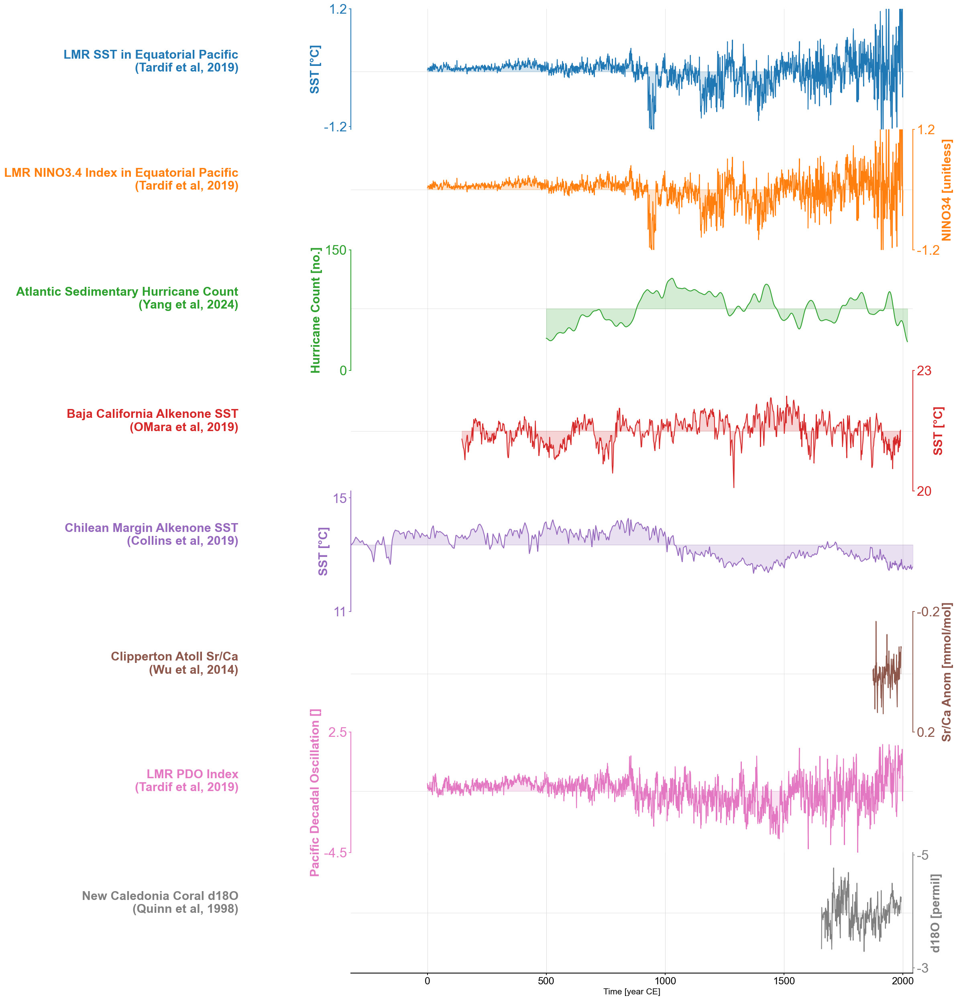

In [30]:
fig, ax = ms.stackplot(labels=['LMR SST in Equatorial Pacific\n(Tardif et al, 2019)',
                               'LMR NINO3.4 Index in Equatorial Pacific\n(Tardif et al, 2019)',
                               'Atlantic Sedimentary Hurricane Count\n(Yang et al, 2024)',
                               'Baja California Alkenone SST\n(OMara et al, 2019)',
                               'Chilean Margin Alkenone SST\n(Collins et al, 2019)',
                               'Clipperton Atoll Sr/Ca\n(Wu et al, 2014)',
                               'LMR PDO Index\n(Tardif et al, 2019)',
                               
                               'New Caledonia Coral d18O\n(Quinn et al, 1998)'],
                      figsize = [14,24], ylabel_fontsize = 22,
                      label_x_loc = -0.2, v_shift_factor=1)


matplotlib.rcParams.update({'font.size': 22})

plt.tick_params(labelsize=18)
plt.rc('xtick', labelsize=18)
plt.rc('ytick', labelsize=18)

ax[0].set_yticks([-1.2,1.2], fontsize = 24)
ax[0].set_yticklabels([-1.2,1.2], fontsize = 24)

ax[1].set_yticks([-1.2,1.2], fontsize = 24)
ax[1].set_yticklabels([-1.2,1.2], fontsize = 24)

ax[2].set_yticks([0,150], fontsize = 24)
ax[2].set_yticklabels([0,150], fontsize = 24)

ax[3].set_yticks([20,23], fontsize = 24)
ax[3].set_yticklabels([20,23], fontsize = 24)

ax[4].set_yticks([11,15], fontsize = 24)
ax[4].set_yticklabels([11,15], fontsize = 24)

ax[5].set_yticks([-0.2,0.2], fontsize = 24)
ax[5].set_yticklabels([-0.2,0.2], fontsize = 24)
ax[5].invert_yaxis()

ax[6].set_yticks([-4.5,2.5], fontsize = 24)
ax[6].set_yticklabels([-4.5,2.5], fontsize = 24)

ax[7].set_yticks([-5,-3], fontsize = 24)
ax[7].set_yticklabels([-5,-3], fontsize = 24)
ax[7].invert_yaxis()

# ax[8].set_yticks([-0.2,0.2], fontsize = 24)
# ax[8].set_yticklabels([-0.2,0.2], fontsize = 24)

# ax[9].set_yticks([-5,-3], fontsize = 24)
# ax[9].set_yticklabels([-5,-3], fontsize = 24)
# ax[9].invert_yaxis()

matplotlib.font_manager.FontProperties(size = 14)
fig.savefig('/Users/akbaskind/Desktop/Paleo/everything.png', bbox_inches='tight')

# Common time correlations

In [22]:
TS2 = [LMR_SST, LMR_nino, hurr, SSTca, SSTperu, LMR_pdo, LMR_nao, LMR_amo]
ms2 = pyleo.MultipleSeries(TS2, label='El Nino Teleconnections', time_unit='year CE')
ms2

                         None
datetime                     
0-01-01 00:00:00     0.009781
0-12-31 05:48:45     0.020032
1-12-31 11:37:31     0.003951
2-12-31 17:26:17     0.010125
3-12-31 23:15:03     0.035259
...                       ...
1995-12-31 10:17:25  0.052353
1996-12-30 16:06:11  0.113348
1997-12-30 21:54:57  0.197319
1998-12-31 03:43:43  0.047181
1999-12-31 09:32:29  0.078629

[2001 rows x 1 columns]

In [23]:
df1 = ms2.common_time().series_list[0]
df2 = ms2.common_time().series_list[1]
df3 = ms2.common_time().series_list[2]
df4 = ms2.common_time().series_list[3]
df5 = ms2.common_time().series_list[4]
df6 = ms2.common_time().series_list[5]
df7 = ms2.common_time().series_list[6]
df8 = ms2.common_time().series_list[7]
df9 = ms.common_time().series_list[5]
df10 = ms.common_time().series_list[9]
df1_2 = ms.common_time().series_list[1]
df6_2 = ms.common_time().series_list[6]
df7_2 = ms.common_time().series_list[7]
df8_2 = ms.common_time().series_list[8]


In [344]:
df1

{}


None
Time [year CE]
500.0     0.040537
501.0     0.033754
502.0     0.115086
503.0    -0.036790
504.0    -0.001172
            ...   
1986.0    0.399752
1987.0    1.321507
1988.0   -0.337050
1989.0   -0.231324
1990.0    0.902284
Name: SST [°C], Length: 1491, dtype: float64

range

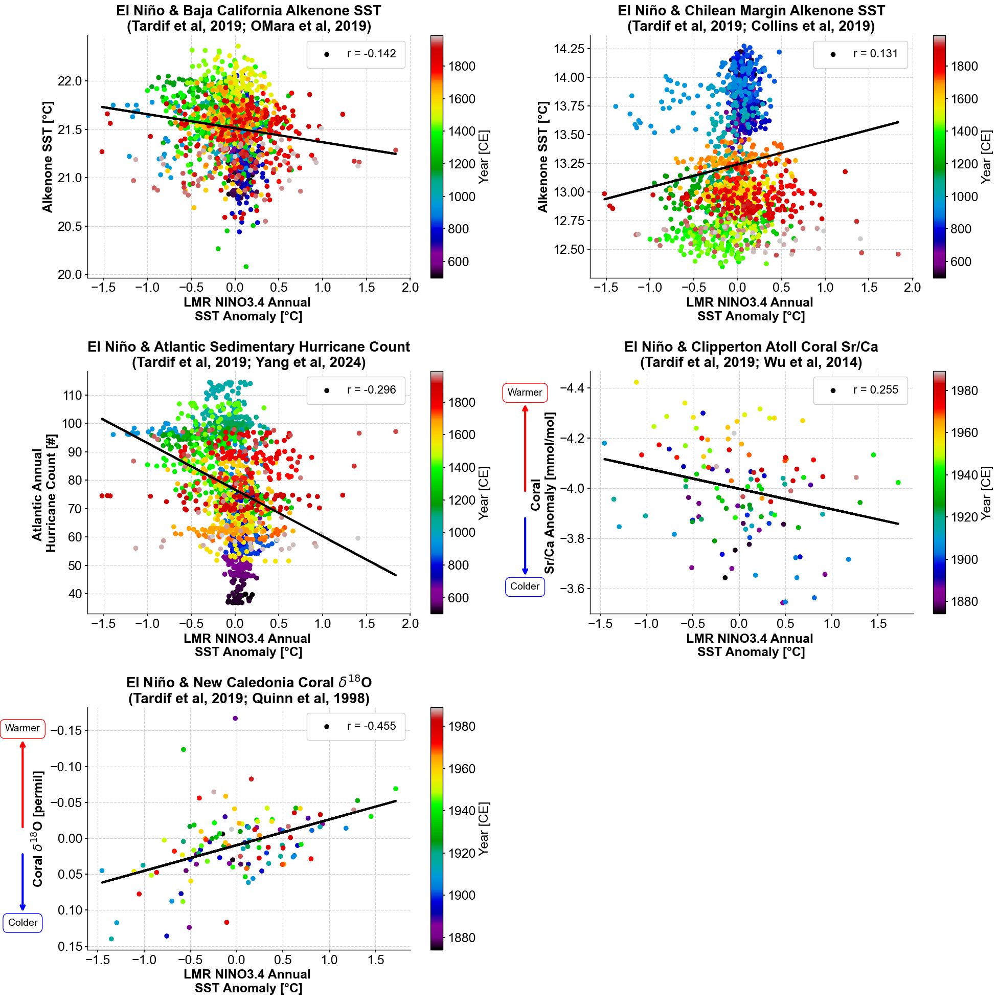

In [366]:
fig, axarr = plt.subplots(nrows = 3, ncols = 2, figsize = [20,20],tight_layout=True)
axarr = axarr.flatten()
fig.tight_layout(pad=300.0)
plt.rcParams["axes.prop_cycle"] = plt.cycler("color", plt.cm.jet(np.linspace(0,1,8)))
colors = plt.rcParams["axes.prop_cycle"]()

ninoindexlong = df2.value
ninoindexshort = df1_2.value
hurrcorr = df3.value
bajacorr = df4.value
perucorr = df5.value
clippertoncorr = df10.value
coralaus = df9.value
pdocorr = df6.value
pdocorrshort = df6_2.value
naocorr = df7.value
naocorrshort = df7_2.value
amocorr = df8.value
amocorrshort = df8_2.value

# El Nino and Baja SST
ax = axarr[0]
c = next(colors)["color"]
r = np.corrcoef(ninoindexlong, bajacorr)
lbl = 'r = ' + str(round(r[0,1],3))
im = ax.scatter(ninoindexlong, bajacorr, c = df4.time, cmap = 'nipy_spectral', label = lbl)
cbar = plt.colorbar(im, ax = ax)
cbar.set_label("Year [CE]", fontsize = 18)
xdata = ninoindexlong.reshape(-1, 1)
ydata = bajacorr.reshape(-1, 1)
res = LinearRegression().fit(xdata, ydata)
y_pred = res.intercept_ + res.coef_ * xdata
ax.plot(xdata, y_pred, c = 'k', lw = 3)

# El Nino and Peru SST
ax = axarr[1]
c = next(colors)["color"]
r = np.corrcoef(ninoindexlong, perucorr)
lbl = 'r = ' + str(round(r[0,1],3))
im = ax.scatter(ninoindexlong, perucorr, c = df5.time, cmap = 'nipy_spectral', label = lbl)
cbar = plt.colorbar(im, ax = ax)
cbar.set_label("Year [CE]", fontsize = 18)
xdata = ninoindexlong.reshape(-1, 1)
ydata = perucorr.reshape(-1, 1)
res = LinearRegression().fit(xdata, ydata)
y_pred = res.intercept_ + res.coef_ * xdata
ax.plot(xdata, y_pred, c = 'k', lw = 3)

# El Nino and Hurricanes
ax = axarr[2]
c = next(colors)["color"]
r = np.corrcoef(ninoindexlong, hurrcorr)
lbl = 'r = ' + str(round(r[0,1],3))
im = ax.scatter(ninoindexlong, hurrcorr, c = df3.time, cmap = 'nipy_spectral', label = lbl)
cbar = plt.colorbar(im, ax = ax)
cbar.set_label("Year [CE]", fontsize = 18)
xdata = ninoindexlong.reshape(-1, 1)
ydata = hurrcorr.reshape(-1, 1)
res = LinearRegression().fit(xdata, ydata)
y_pred = res.intercept_ + res.coef_ * xdata
ax.plot(xdata, y_pred, c = 'k', lw = 3)

# El Nino and Clipperton Sr/Ca
ax = axarr[3]
c = next(colors)["color"]
r = np.corrcoef(ninoindexshort, clippertoncorr)
lbl = 'r = ' + str(round(r[0,1],3))
im = ax.scatter(ninoindexshort, clippertoncorr, c = df10.time, cmap = 'nipy_spectral', label = lbl)
cbar = plt.colorbar(im, ax = ax)
cbar.set_label("Year [CE]", fontsize = 18)
xdata = ninoindexshort.reshape(-1, 1)
ydata = clippertoncorr.reshape(-1, 1)
res = LinearRegression().fit(xdata, ydata)
y_pred = res.intercept_ + res.coef_ * xdata
ax.plot(xdata, y_pred, c = 'k', lw = 3)
ax.invert_yaxis()
ax.annotate("Warmer",
            xy=(0.1 - 0.3, 0.5), xycoords = 'axes fraction',
            xytext=(0.1 - 0.3, 0.9), textcoords = 'axes fraction',horizontalalignment="center",
            arrowprops=dict(arrowstyle="<-", lw = 3, color = 'red'),
                            fontsize = 14,
            bbox=dict(facecolor='white', edgecolor='red', boxstyle='round,pad=0.5'))
ax.annotate("Colder",
            xy=(0.1 - 0.3, 0.4), xycoords = 'axes fraction',
            xytext=(0.1 - 0.3, 0.1), textcoords = 'axes fraction',
            arrowprops=dict(arrowstyle="<-", lw = 3, color = 'blue'),horizontalalignment="center",
            fontsize = 14,
            bbox=dict(facecolor='white', edgecolor='blue', boxstyle='round,pad=0.5'))

# El Nino and Caledonia Coral
ax = axarr[4]
c = next(colors)["color"]
r = np.corrcoef(ninoindexshort, coralaus)
lbl = 'r = ' + str(round(r[0,1],3))
im = ax.scatter(ninoindexshort, coralaus, c = df9.time, cmap = 'nipy_spectral', label = lbl)
xdata = ninoindexshort.reshape(-1, 1)
cbar = plt.colorbar(im, ax = ax)
cbar.set_label("Year [CE]", fontsize = 18)
ydata = coralaus.reshape(-1, 1)
res = LinearRegression().fit(xdata, ydata)
y_pred = res.intercept_ + res.coef_ * xdata
ax.plot(xdata, y_pred, c = 'k', lw = 3)
ax.invert_yaxis()
ax.annotate("Warmer",
            xy=(0.1 - 0.3, 0.5), xycoords = 'axes fraction',
            xytext=(0.1 - 0.3, 0.9), textcoords = 'axes fraction',
            arrowprops=dict(arrowstyle="<-", lw = 3, color = 'red'),horizontalalignment="center",
                            fontsize = 14,
            bbox=dict(facecolor='white', edgecolor='red', boxstyle='round,pad=0.5'))
ax.annotate("Colder",
            xy=(0.1 - 0.3, 0.4), xycoords = 'axes fraction',
            xytext=(0.1 - 0.3, 0.1), textcoords = 'axes fraction',
            arrowprops=dict(arrowstyle="<-", lw = 3, color = 'blue'),horizontalalignment="center",
            fontsize = 14,
            bbox=dict(facecolor='white', edgecolor='blue', boxstyle='round,pad=0.5'))

xlabs = np.asarray(['LMR NINO3.4 Annual \nSST Anomaly [°C]','LMR NINO3.4 Annual \nSST Anomaly [°C]','LMR NINO3.4 Annual \nSST Anomaly [°C]',
                   'LMR NINO3.4 Annual \nSST Anomaly [°C]','LMR NINO3.4 Annual \nSST Anomaly [°C]', '',
                   'LMR Pacific Decadal Oscillation Index','LMR Pacific Decadal Oscillation Index','LMR Pacific Decadal Oscillation Index',
                   'LMR Pacific Decadal Oscillation Index'])
ylabs = np.asarray(['Alkenone SST [°C]', 'Alkenone SST [°C]',
                    'Atlantic Annual \nHurricane Count [#]',
                    'Coral \nSr/Ca Anomaly [mmol/mol]',
                    'Coral $\delta^{18}$O [permil]','',
                    'Alkenone SST [°C]', 'Alkenone SST [°C]',
                    'Atlantic Annual \nHurricane Count [#]',
                    'Coral \nSr/Ca Anomaly [mmol/mol]',
                    'Coral $\delta^{18}$O [permil]'])
titles = np.asarray(['El Niño & Baja California Alkenone SST\n(Tardif et al, 2019; OMara et al, 2019)',
                     'El Niño & Chilean Margin Alkenone SST\n(Tardif et al, 2019; Collins et al, 2019)',
                     'El Niño & Atlantic Sedimentary Hurricane Count\n(Tardif et al, 2019; Yang et al, 2024)',
                     'El Niño & Clipperton Atoll Coral Sr/Ca\n(Tardif et al, 2019; Wu et al, 2014)',
                     'El Niño & New Caledonia Coral $\delta^{18}$O\n(Tardif et al, 2019; Quinn et al, 1998)','',
                     'PDO & Baja California Alkenone SST\n(Tardif et al, 2019; OMara et al, 2019)',
                     'PDO & Chilean Margin Alkenone SST\n(Tardif et al, 2019; Collins et al, 2019)',
                     'PDO & Atlantic Sedimentary Hurricane Count\n(Tardif et al, 2019; Yang et al, 2024)',
                     'PDO & Clipperton Atoll Coral Sr/Ca\n(Tardif et al, 2019; Wu et al, 2014)',
                     'PDO & New Caledonia Coral $\delta^{18}$O\n(Tardif et al, 2019; Quinn et al, 1998)'])
n = 0
for ax in axarr:
    ax.legend(fontsize = 16)
    ax.legend(loc = 'upper right', frameon = 1,labelspacing = 1.15, borderpad = 0.75, fontsize = 16,
                  framealpha = 1, facecolor = 'white')
    ax.set_xlabel(xlabs[n], fontsize = 18, fontweight = 'bold')
    ax.set_ylabel(ylabs[n], fontsize = 18, fontweight = 'bold')
    ax.set_title(titles[n], fontsize = 20, fontweight = 'bold')
    # ax.set_ylabel(labels[n], fontsize = 16)
    # stri = 'r = ' + str(rvals[n])
    # ax.set_title(stri, fontsize = 18)
    n = n + 1
    
axarr[5].remove()
fig.savefig('/Users/akbaskind/Desktop/Paleo/ENSOcorrs.png', bbox_inches='tight')

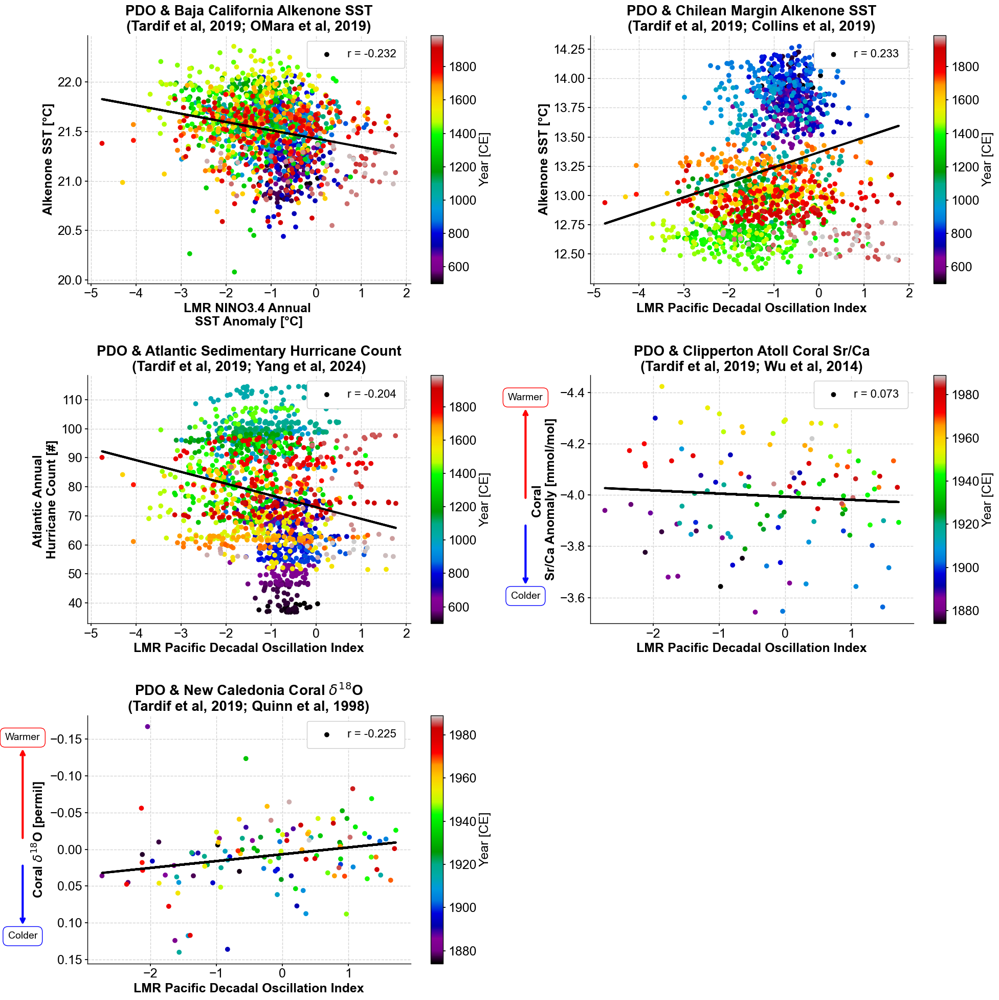

In [365]:
fig, axarr = plt.subplots(nrows = 3, ncols = 2, figsize = [20,20],tight_layout=True)
axarr = axarr.flatten()
fig.tight_layout(pad=300.0)
plt.rcParams["axes.prop_cycle"] = plt.cycler("color", plt.cm.jet(np.linspace(0,1,8)))
colors = plt.rcParams["axes.prop_cycle"]()

ninoindexlong = df2.value
ninoindexshort = df1_2.value
hurrcorr = df3.value
bajacorr = df4.value
perucorr = df5.value
clippertoncorr = df10.value
coralaus = df9.value
pdocorr = df6.value
pdocorrshort = df6_2.value
naocorr = df7.value
naocorrshort = df7_2.value
amocorr = df8.value
amocorrshort = df8_2.value

# El Nino and Baja SST
ax = axarr[0]
c = next(colors)["color"]
r = np.corrcoef(pdocorr, bajacorr)
lbl = 'r = ' + str(round(r[0,1],3))
im = ax.scatter(pdocorr, bajacorr, c = df4.time, cmap = 'nipy_spectral', label = lbl)
cbar = plt.colorbar(im, ax = ax)
cbar.set_label("Year [CE]", fontsize = 18)
xdata = pdocorr.reshape(-1, 1)
ydata = bajacorr.reshape(-1, 1)
res = LinearRegression().fit(xdata, ydata)
y_pred = res.intercept_ + res.coef_ * xdata
ax.plot(xdata, y_pred, c = 'k', lw = 3)

# El Nino and Peru SST
ax = axarr[1]
c = next(colors)["color"]
r = np.corrcoef(pdocorr, perucorr)
lbl = 'r = ' + str(round(r[0,1],3))
im = ax.scatter(pdocorr, perucorr, c = df5.time, cmap = 'nipy_spectral', label = lbl)
cbar = plt.colorbar(im, ax = ax)
cbar.set_label("Year [CE]", fontsize = 18)
xdata = pdocorr.reshape(-1, 1)
ydata = perucorr.reshape(-1, 1)
res = LinearRegression().fit(xdata, ydata)
y_pred = res.intercept_ + res.coef_ * xdata
ax.plot(xdata, y_pred, c = 'k', lw = 3)

# El Nino and Hurricanes
ax = axarr[2]
c = next(colors)["color"]
r = np.corrcoef(pdocorr, hurrcorr)
lbl = 'r = ' + str(round(r[0,1],3))
im = ax.scatter(pdocorr, hurrcorr, c = df3.time, cmap = 'nipy_spectral', label = lbl)
cbar = plt.colorbar(im, ax = ax)
cbar.set_label("Year [CE]", fontsize = 18)
xdata = pdocorr.reshape(-1, 1)
ydata = hurrcorr.reshape(-1, 1)
res = LinearRegression().fit(xdata, ydata)
y_pred = res.intercept_ + res.coef_ * xdata
ax.plot(xdata, y_pred, c = 'k', lw = 3)

# El Nino and Clipperton Sr/Ca
ax = axarr[3]
c = next(colors)["color"]
r = np.corrcoef(pdocorrshort, clippertoncorr)
lbl = 'r = ' + str(round(r[0,1],3))
im = ax.scatter(pdocorrshort, clippertoncorr, c = df10.time, cmap = 'nipy_spectral', label = lbl)
cbar = plt.colorbar(im, ax = ax)
cbar.set_label("Year [CE]", fontsize = 18)
xdata = pdocorrshort.reshape(-1, 1)
ydata = clippertoncorr.reshape(-1, 1)
res = LinearRegression().fit(xdata, ydata)
y_pred = res.intercept_ + res.coef_ * xdata
ax.plot(xdata, y_pred, c = 'k', lw = 3)
ax.invert_yaxis()
ax.annotate("Warmer",
            xy=(0.1 - 0.3, 0.5), xycoords = 'axes fraction',
            xytext=(0.1 - 0.3, 0.9), textcoords = 'axes fraction',horizontalalignment="center",
            arrowprops=dict(arrowstyle="<-", lw = 3, color = 'red'),
                            fontsize = 14,
            bbox=dict(facecolor='white', edgecolor='red', boxstyle='round,pad=0.5'))
ax.annotate("Colder",
            xy=(0.1 - 0.3, 0.4), xycoords = 'axes fraction',
            xytext=(0.1 - 0.3, 0.1), textcoords = 'axes fraction',
            arrowprops=dict(arrowstyle="<-", lw = 3, color = 'blue'),horizontalalignment="center",
            fontsize = 14,
            bbox=dict(facecolor='white', edgecolor='blue', boxstyle='round,pad=0.5'))

# El Nino and Caledonia Coral
ax = axarr[4]
c = next(colors)["color"]
r = np.corrcoef(pdocorrshort, coralaus)
lbl = 'r = ' + str(round(r[0,1],3))
im = ax.scatter(pdocorrshort, coralaus, c = df9.time, cmap = 'nipy_spectral', label = lbl)
xdata = pdocorrshort.reshape(-1, 1)
cbar = plt.colorbar(im, ax = ax)
cbar.set_label("Year [CE]", fontsize = 18)
ydata = coralaus.reshape(-1, 1)
res = LinearRegression().fit(xdata, ydata)
y_pred = res.intercept_ + res.coef_ * xdata
ax.plot(xdata, y_pred, c = 'k', lw = 3)
ax.invert_yaxis()
ax.annotate("Warmer",
            xy=(0.1 - 0.3, 0.5), xycoords = 'axes fraction',
            xytext=(0.1 - 0.3, 0.9), textcoords = 'axes fraction',
            arrowprops=dict(arrowstyle="<-", lw = 3, color = 'red'),horizontalalignment="center",
                            fontsize = 14,
            bbox=dict(facecolor='white', edgecolor='red', boxstyle='round,pad=0.5'))
ax.annotate("Colder",
            xy=(0.1 - 0.3, 0.4), xycoords = 'axes fraction',
            xytext=(0.1 - 0.3, 0.1), textcoords = 'axes fraction',
            arrowprops=dict(arrowstyle="<-", lw = 3, color = 'blue'),horizontalalignment="center",
            fontsize = 14,
            bbox=dict(facecolor='white', edgecolor='blue', boxstyle='round,pad=0.5'))

xlabs = np.asarray(['LMR NINO3.4 Annual \nSST Anomaly [°C]', 'LMR Pacific Decadal Oscillation Index',
                   'LMR Pacific Decadal Oscillation Index','LMR Pacific Decadal Oscillation Index','LMR Pacific Decadal Oscillation Index',
                   'LMR Pacific Decadal Oscillation Index', ''])
ylabs = np.asarray(['Alkenone SST [°C]', 'Alkenone SST [°C]',
                    'Atlantic Annual \nHurricane Count [#]',
                    'Coral \nSr/Ca Anomaly [mmol/mol]',
                    'Coral $\delta^{18}$O [permil]', ''])
titles = np.asarray(['PDO & Baja California Alkenone SST\n(Tardif et al, 2019; OMara et al, 2019)',
                     'PDO & Chilean Margin Alkenone SST\n(Tardif et al, 2019; Collins et al, 2019)',
                     'PDO & Atlantic Sedimentary Hurricane Count\n(Tardif et al, 2019; Yang et al, 2024)',
                     'PDO & Clipperton Atoll Coral Sr/Ca\n(Tardif et al, 2019; Wu et al, 2014)',
                     'PDO & New Caledonia Coral $\delta^{18}$O\n(Tardif et al, 2019; Quinn et al, 1998)', ''])


n = 0
for ax in axarr:
    ax.legend(fontsize = 16)
    ax.legend(loc = 'upper right', frameon = 1,labelspacing = 1.15, borderpad = 0.75, fontsize = 16,
                  framealpha = 1, facecolor = 'white')
    ax.set_xlabel(xlabs[n], fontsize = 18, fontweight = 'bold')
    ax.set_ylabel(ylabs[n], fontsize = 18, fontweight = 'bold')
    ax.set_title(titles[n], fontsize = 20, fontweight = 'bold')
    # ax.set_ylabel(labels[n], fontsize = 16)
    # stri = 'r = ' + str(rvals[n])
    # ax.set_title(stri, fontsize = 18)
    n = n + 1
    
axarr[5].remove()
fig.savefig('/Users/akbaskind/Desktop/Paleo/PDOcorrs.png', bbox_inches='tight')

# Pyleoclim Correlations

## Correlation with NINO3.4

In [535]:
corrMS = ms.correlation(LMR_nino,settings={'method':'isospectral','nsim':1000},seed=333) 
R = corrMS.r
P = corrMS.p
S = corrMS.signif
labs=['LMR SST in Equatorial Pacific\n(Tardif et al, 2019)',
                               'LMR NINO3.4 Index in Equatorial Pacific\n(Tardif et al, 2019)',
                               'Atlantic Sedimentary Hurricane Count\n(Yang et al, 2024)',
                               'Baja California Alkenone SST\n(OMara et al, 2019)',
                               'Peru Alkenone SST\n(Collins et al, 2018)',
                               'Clipperton Atoll Sr/Ca\n(Wu et al, 2014)',
                               'LMR PDO Index\n(Tardif et al, 2019)',
                               'LMR NAO Index\n(Tardif et al, 2019)', 'LMR AMO Index\n(Tardif et al, 2019)',
     'New Caledonia Coral d18O\n(Quinn et al, 1998)']
corr_nino = {'Var': labs,'r': R, 'p': P, 'significance': S}
corr_nino = pd.DataFrame(corr_nino)
corr_nino

Looping over 10 Series in collection


100%|██████████| 10/10 [00:04<00:00,  2.44it/s]


,Var,r,p,significance
0,"LMR SST in Equatorial Pacific\n(Tardif et al, ...",1.000000,0.000,True
1,LMR NINO3.4 Index in Equatorial Pacific\n(Tard...,1.000000,0.000,True
2,Atlantic Sedimentary Hurricane Count\n(Yang et...,-0.298340,0.013,True
3,"Baja California Alkenone SST\n(OMara et al, 2019)",-0.157935,0.207,False
4,"Peru Alkenone SST\n(Collins et al, 2018)",0.167533,0.563,False
5,"Clipperton Atoll Sr/Ca\n(Wu et al, 2014)",-0.504232,0.000,True
6,"LMR PDO Index\n(Tardif et al, 2019)",0.535135,0.000,True
7,"LMR NAO Index\n(Tardif et al, 2019)",-0.196690,0.000,True
8,"LMR AMO Index\n(Tardif et al, 2019)",-0.113455,0.153,False
9,"New Caledonia Coral d18O\n(Quinn et al, 1998)",0.023962,0.731,False


## Correlation with PDO

In [536]:
corrMS = ms.correlation(LMR_pdo,settings={'method':'isospectral','nsim':1000},seed=333) 
R = corrMS.r
P = corrMS.p
S = corrMS.signif
labs=['LMR SST in Equatorial Pacific\n(Tardif et al, 2019)',
                               'LMR NINO3.4 Index in Equatorial Pacific\n(Tardif et al, 2019)',
                               'Atlantic Sedimentary Hurricane Count\n(Yang et al, 2024)',
                               'Baja California Alkenone SST\n(OMara et al, 2019)',
                               'Peru Alkenone SST\n(Collins et al, 2018)',
                               'Clipperton Atoll Sr/Ca\n(Wu et al, 2014)',
                               'LMR PDO Index\n(Tardif et al, 2019)',
                               'LMR NAO Index\n(Tardif et al, 2019)', 'LMR AMO Index\n(Tardif et al, 2019)','New Caledonia Coral d18O\n(Quinn et al, 1998)']
corr_pdo = {'Var': labs,'r': R, 'p': P, 'significance': S}
corr_pdo = pd.DataFrame(corr_pdo)
corr_pdo

Looping over 10 Series in collection


100%|██████████| 10/10 [00:04<00:00,  2.35it/s]


,Var,r,p,significance
0,"LMR SST in Equatorial Pacific\n(Tardif et al, ...",0.535153,0.000,True
1,LMR NINO3.4 Index in Equatorial Pacific\n(Tard...,0.535135,0.000,True
2,Atlantic Sedimentary Hurricane Count\n(Yang et...,-0.211531,0.332,False
3,"Baja California Alkenone SST\n(OMara et al, 2019)",-0.234308,0.102,False
4,"Peru Alkenone SST\n(Collins et al, 2018)",0.284031,0.416,False
5,"Clipperton Atoll Sr/Ca\n(Wu et al, 2014)",-0.259898,0.010,True
6,"LMR PDO Index\n(Tardif et al, 2019)",1.000000,0.000,True
7,"LMR NAO Index\n(Tardif et al, 2019)",-0.097999,0.000,True
8,"LMR AMO Index\n(Tardif et al, 2019)",0.316324,0.000,True
9,"New Caledonia Coral d18O\n(Quinn et al, 1998)",0.006788,0.952,False


## Correlation with NAO

In [537]:
corrMS = ms.correlation(LMR_nao,settings={'method':'isospectral','nsim':1000},seed=333) 
R = corrMS.r
P = corrMS.p
S = corrMS.signif
labs=['LMR SST in Equatorial Pacific\n(Tardif et al, 2019)',
                               'LMR NINO3.4 Index in Equatorial Pacific\n(Tardif et al, 2019)',
                               'Atlantic Sedimentary Hurricane Count\n(Yang et al, 2024)',
                               'Baja California Alkenone SST\n(OMara et al, 2019)',
                               'Peru Alkenone SST\n(Collins et al, 2018)',
                               'Clipperton Atoll Sr/Ca\n(Wu et al, 2014)',
                               'LMR PDO Index\n(Tardif et al, 2019)',
                               'LMR NAO Index\n(Tardif et al, 2019)', 'LMR AMO Index\n(Tardif et al, 2019)','New Caledonia Coral d18O\n(Quinn et al, 1998)']
corr_nao = {'Var': labs,'r': R, 'p': P, 'significance': S}
corr_nao = pd.DataFrame(corr_nao)
corr_nao

Looping over 10 Series in collection


100%|██████████| 10/10 [00:04<00:00,  2.41it/s]


,Var,r,p,significance
0,"LMR SST in Equatorial Pacific\n(Tardif et al, ...",-0.196689,0.000,True
1,LMR NINO3.4 Index in Equatorial Pacific\n(Tard...,-0.196690,0.000,True
2,Atlantic Sedimentary Hurricane Count\n(Yang et...,-0.001153,0.989,False
3,"Baja California Alkenone SST\n(OMara et al, 2019)",0.074381,0.114,False
4,"Peru Alkenone SST\n(Collins et al, 2018)",-0.068782,0.157,False
5,"Clipperton Atoll Sr/Ca\n(Wu et al, 2014)",0.139566,0.235,False
6,"LMR PDO Index\n(Tardif et al, 2019)",-0.097999,0.000,True
7,"LMR NAO Index\n(Tardif et al, 2019)",1.000000,0.000,True
8,"LMR AMO Index\n(Tardif et al, 2019)",0.080867,0.043,True
9,"New Caledonia Coral d18O\n(Quinn et al, 1998)",-0.005866,0.971,False


## Correlation with AMO

In [538]:
corrMS = ms.correlation(LMR_amo,settings={'method':'isospectral','nsim':1000},seed=333) 
R = corrMS.r
P = corrMS.p
S = corrMS.signif
labs=['LMR SST in Equatorial Pacific\n(Tardif et al, 2019)',
                               'LMR NINO3.4 Index in Equatorial Pacific\n(Tardif et al, 2019)',
                               'Atlantic Sedimentary Hurricane Count\n(Yang et al, 2024)',
                               'Baja California Alkenone SST\n(OMara et al, 2019)',
                               'Peru Alkenone SST\n(Collins et al, 2018)',
                               'Clipperton Atoll Sr/Ca\n(Wu et al, 2014)',
                               'LMR PDO Index\n(Tardif et al, 2019)',
                               'LMR NAO Index\n(Tardif et al, 2019)', 'LMR AMO Index\n(Tardif et al, 2019)','New Caledonia Coral d18O\n(Quinn et al, 1998)']
corr_amo = {'Var': labs,'r': R, 'p': P, 'significance': S}
corr_amo = pd.DataFrame(corr_amo)
corr_amo

Looping over 10 Series in collection


100%|██████████| 10/10 [00:04<00:00,  2.46it/s]


,Var,r,p,significance
0,"LMR SST in Equatorial Pacific\n(Tardif et al, ...",-0.113439,0.170,False
1,LMR NINO3.4 Index in Equatorial Pacific\n(Tard...,-0.113455,0.170,False
2,Atlantic Sedimentary Hurricane Count\n(Yang et...,0.080092,0.673,False
3,"Baja California Alkenone SST\n(OMara et al, 2019)",-0.021329,0.872,False
4,"Peru Alkenone SST\n(Collins et al, 2018)",0.161552,0.428,False
5,"Clipperton Atoll Sr/Ca\n(Wu et al, 2014)",-0.208262,0.145,False
6,"LMR PDO Index\n(Tardif et al, 2019)",0.316324,0.000,True
7,"LMR NAO Index\n(Tardif et al, 2019)",0.080867,0.051,False
8,"LMR AMO Index\n(Tardif et al, 2019)",1.000000,0.000,True
9,"New Caledonia Coral d18O\n(Quinn et al, 1998)",-0.060457,0.746,False


# Data Locations

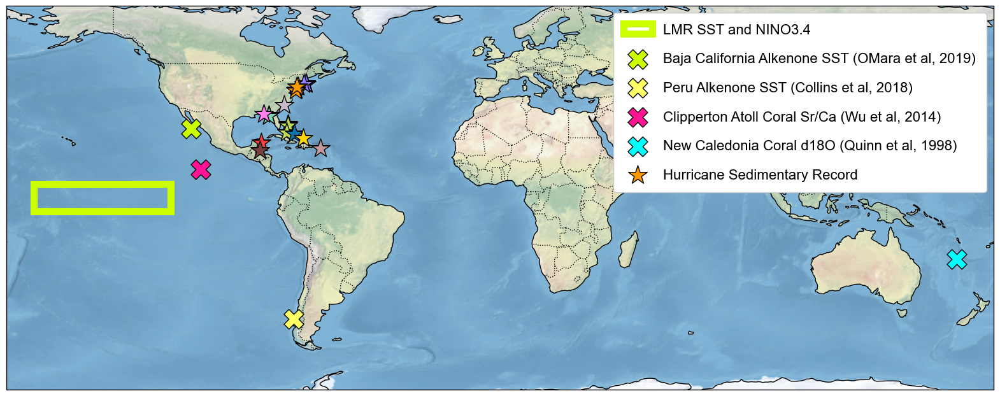

In [637]:
fig, ax = plt.subplots(figsize = [20,15],subplot_kw={'projection':ccrs.PlateCarree()})

import matplotlib.patches as mpatches


# ax.coastlines()
ax.set_extent([-180, 180, -70, 70], crs=ccrs.PlateCarree())
ax.add_patch(mpatches.Rectangle(xy=[190, -5], width=50, height=10,
                                facecolor='none', edgecolor='#ccff00', linewidth = 8,
                                transform=ccrs.PlateCarree(),label = 'LMR SST and NINO3.4'))

# San Lazaro Basin (SLB) at 25° 10'N, 112° 45'W
ax.scatter(-112.75, 25.166667, s = 500, marker = 'X', edgecolors = 'k', facecolors = '#ccff00', 
           label = 'Baja California Alkenone SST (OMara et al, 2019)', zorder = 3)
# Peru: Latitude: -44.150500, Longitude: -75.150833
ax.scatter(-75.150833, -44.1505, s = 500, marker = 'X', edgecolors = 'k', facecolors = '#ffff66',
          label = 'Peru Alkenone SST (Collins et al, 2018)', zorder = 3)
# Clipperton Atoll: Latitude: 10.300000 * Longitude: -109.216660
ax.scatter(-109.216660, 10.3, s = 500, marker = 'X', edgecolors = 'k', facecolors = '#ff1493',
          label = 'Clipperton Atoll Coral Sr/Ca (Wu et al, 2014)', zorder = 3)
# New Caledonia: Latitude: -22.480000 * Longitude: 166.470000
ax.scatter(166.470000, -22.480000, s = 500, marker = 'X', edgecolors = 'k', facecolors = 'cyan',
          label = 'New Caledonia Coral d18O (Quinn et al, 1998)', zorder = 3)

# Hurricanes
NEx = [-70.62, -70.78, -71.521]
NEy = [41.54, 41.65, 41.379]
ax.scatter(NEx, NEy, s = 500, marker = '*', edgecolors = 'k', facecolors = '#947fff',
          zorder = 3)
MAx = [-73.58,-74.36,-74.67,-74.17]
MAy = [40.597,39.4,39.18,40.52]
ax.scatter(MAx, MAy, s = 500, marker = '*', edgecolors = 'k', facecolors = '#fa9901', zorder = 3,
          label = 'Hurricane Sedimentary Record')
SEx = -78.79
SEy = 33.76
ax.scatter(SEx, SEy, s = 500, marker = '*', edgecolors = 'k', facecolors = '#c7bbc9', zorder = 3)
GABx = [-84.338,-84.328,-84.355]
GABy = [29.925,30.098,29.932]
ax.scatter(GABx, GABy, s = 500, marker = '*', edgecolors = 'k', facecolors = '#83d4ba', zorder = 3)
GCBx = -86.245
GCBy = 30.491
ax.scatter(GCBx, GCBy, s = 500, marker = '*', edgecolors = 'k', facecolors = '#ff80ed', zorder = 3)
abacox = -77.42
abacoy = 26.79
ax.scatter(abacox, abacoy, s = 500, marker = '*', edgecolors = 'k', facecolors = '#800080', zorder = 3)
androsx = [-77.293,-77.719]
androsy = [26.323,23.779]
ax.scatter(androsx, androsy, s = 500, marker = '*', edgecolors = 'k', facecolors = '#bada55', zorder = 3)
LIx = -75.118
LIy = 23.265
ax.scatter(LIx, LIy, s = 500, marker = '*', edgecolors = 'k', facecolors = '#0a75ad', zorder = 3)
MCx = -71.8128
MCy = 21.7198
ax.scatter(MCx, MCy, s = 500, marker = '*', edgecolors = 'k', facecolors = '#ffd700', zorder = 3)
PRx = -65.517
PRy = 18.089
ax.scatter(PRx, PRy, s = 500, marker = '*', edgecolors = 'k', facecolors = '#c39797', zorder = 3)
Yx = -87.06
Yy = 20.04
ax.scatter(Yx, Yy, s = 500, marker = '*', edgecolors = 'k', facecolors = '#ff4040', zorder = 3)
LRBx = -87.534
LRBy = 17.315
ax.scatter(LRBx, LRBy, s = 500, marker = '*', edgecolors = 'k', facecolors = '#794044', zorder = 3)

ax.add_feature(cfeature.LAND)
ax.add_feature(cfeature.OCEAN)
ax.add_feature(cfeature.BORDERS, linestyle=':')
ax.add_feature(cfeature.COASTLINE, zorder = 1)
ax.stock_img()

legend = ax.legend(loc = 'upper right', frameon = 1,labelspacing = 1.15, borderpad = 0.75, fontsize = 16,
                  framealpha = 1, facecolor = 'white')
# frame = legend.get_frame()
# frame.set_color('white')

plt.show()
# fig.savefig('/Users/akbaskind/Desktop/Paleo/map.png', bbox_inches='tight')

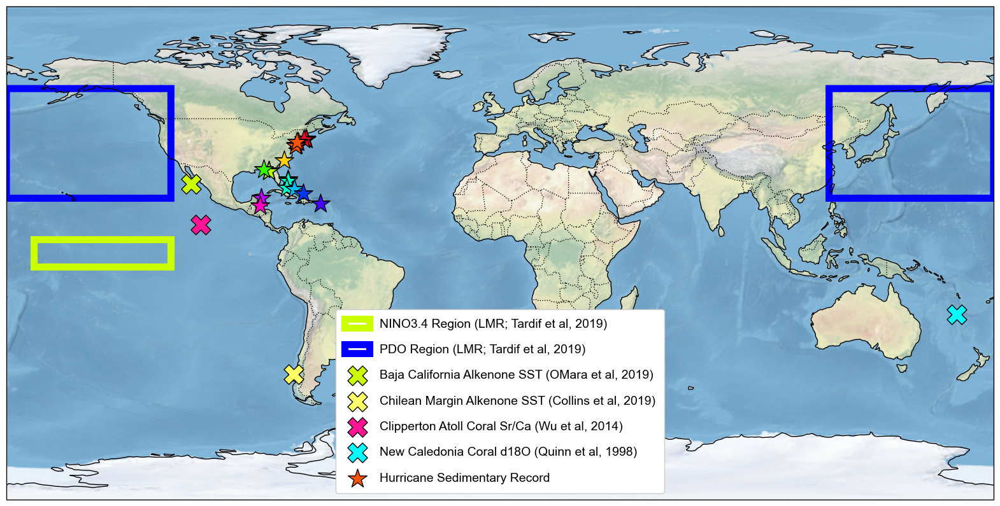

In [268]:
fig, ax = plt.subplots(figsize = [20,15],subplot_kw={'projection':ccrs.PlateCarree()})

import matplotlib.patches as mpatches


# ax.coastlines()
ax.set_extent([-180, 180, -90, 90], crs=ccrs.PlateCarree())
ax.add_patch(mpatches.Rectangle(xy=[190, -5], width=50, height=10,
                                facecolor='none', edgecolor='#ccff00', linewidth = 8,
                                transform=ccrs.PlateCarree(),label = 'NINO3.4 Region (LMR; Tardif et al, 2019)'))

ax.add_patch(mpatches.Rectangle(xy=[120, 20], width=120, height=40,
                                facecolor='none', edgecolor='blue', linewidth = 8,
                                transform=ccrs.PlateCarree(),label = 'PDO Region (LMR; Tardif et al, 2019)'))

# San Lazaro Basin (SLB) at 25° 10'N, 112° 45'W
ax.scatter(-112.75, 25.166667, s = 500, marker = 'X', edgecolors = 'k', facecolors = '#ccff00', 
           label = 'Baja California Alkenone SST (OMara et al, 2019)', zorder = 3)
# Peru: Latitude: -44.150500, Longitude: -75.150833
ax.scatter(-75.150833, -44.1505, s = 500, marker = 'X', edgecolors = 'k', facecolors = '#ffff66',
          label = 'Chilean Margin Alkenone SST (Collins et al, 2019)', zorder = 3)
# Clipperton Atoll: Latitude: 10.300000 * Longitude: -109.216660
ax.scatter(-109.216660, 10.3, s = 500, marker = 'X', edgecolors = 'k', facecolors = '#ff1493',
          label = 'Clipperton Atoll Coral Sr/Ca (Wu et al, 2014)', zorder = 3)
# New Caledonia: Latitude: -22.480000 * Longitude: 166.470000
ax.scatter(166.470000, -22.480000, s = 500, marker = 'X', edgecolors = 'k', facecolors = 'cyan',
          label = 'New Caledonia Coral d18O (Quinn et al, 1998)', zorder = 3)

# Hurricanes
plt.rcParams["axes.prop_cycle"] = plt.cycler("color", plt.cm.gist_rainbow(np.linspace(0,1,12)))
colors = plt.rcParams["axes.prop_cycle"]()
c = next(colors)["color"]
NEx = [-70.62, -70.78, -71.521]
NEy = [41.54, 41.65, 41.379]
ax.scatter(NEx, NEy, s = 500, marker = '*', edgecolors = 'k', facecolors = c,
          zorder = 3)
c = next(colors)["color"]
MAx = [-73.58,-74.36,-74.67,-74.17]
MAy = [40.597,39.4,39.18,40.52]
ax.scatter(MAx, MAy, s = 500, marker = '*', edgecolors = 'k', facecolors = c, zorder = 3,
          label = 'Hurricane Sedimentary Record')
c = next(colors)["color"]
SEx = -78.79
SEy = 33.76
ax.scatter(SEx, SEy, s = 500, marker = '*', edgecolors = 'k', facecolors = c, zorder = 3)
c = next(colors)["color"]
GABx = [-84.338,-84.328,-84.355]
GABy = [29.925,30.098,29.932]
ax.scatter(GABx, GABy, s = 500, marker = '*', edgecolors = 'k', facecolors = c, zorder = 3)
c = next(colors)["color"]
GCBx = -86.245
GCBy = 30.491
ax.scatter(GCBx, GCBy, s = 500, marker = '*', edgecolors = 'k', facecolors = c, zorder = 3)
c = next(colors)["color"]
abacox = -77.42
abacoy = 26.79
ax.scatter(abacox, abacoy, s = 500, marker = '*', edgecolors = 'k', facecolors = c, zorder = 3)
c = next(colors)["color"]
androsx = [-77.293,-77.719]
androsy = [26.323,23.779]
ax.scatter(androsx, androsy, s = 500, marker = '*', edgecolors = 'k', facecolors = c, zorder = 3)
c = next(colors)["color"]
LIx = -75.118
LIy = 23.265
ax.scatter(LIx, LIy, s = 500, marker = '*', edgecolors = 'k', facecolors = c, zorder = 3)
c = next(colors)["color"]
MCx = -71.8128
MCy = 21.7198
ax.scatter(MCx, MCy, s = 500, marker = '*', edgecolors = 'k', facecolors = c, zorder = 3)
c = next(colors)["color"]
PRx = -65.517
PRy = 18.089
ax.scatter(PRx, PRy, s = 500, marker = '*', edgecolors = 'k', facecolors = c, zorder = 3)
c = next(colors)["color"]
Yx = -87.06
Yy = 20.04
ax.scatter(Yx, Yy, s = 500, marker = '*', edgecolors = 'k', facecolors = c, zorder = 3)
c = next(colors)["color"]
LRBx = -87.534
LRBy = 17.315
ax.scatter(LRBx, LRBy, s = 500, marker = '*', edgecolors = 'k', facecolors = c, zorder = 3)

ax.add_feature(cfeature.LAND)
ax.add_feature(cfeature.OCEAN)
ax.add_feature(cfeature.BORDERS, linestyle=':')
ax.add_feature(cfeature.COASTLINE, zorder = 1)
ax.stock_img()

legend = ax.legend(loc = 'lower center', frameon = 1,labelspacing = 1.15, borderpad = 0.75, fontsize = 14,
                  framealpha = 1, facecolor = 'white')
# frame = legend.get_frame()
# frame.set_color('white')

plt.show()
fig.savefig('/Users/akbaskind/Desktop/Paleo/map.png', bbox_inches='tight')

# Spectral analysis
[LMR_SST, LMR_nino, hurr, SSTca, SSTperu, coralSrCa, LMR_pdo, LMR_nao, LMR_amo, corald180]

In [121]:
c1 = '#ff4040'
c2 = '#c39797'
c3 = '#ffd700'
c4 = '#0a75ad'
c5 = '#bada55'
c6 = '#800080'
c7 = '#ff80ed'
c8 = '#83d4ba'
c9 = '#c7bbc9'
c10 = '#fa9901'
c11 = '#947fff'

Performing spectral analysis on individual series: 100%|██████████| 200/200 [00:01<00:00, 110.83it/s]
Performing spectral analysis on individual series: 100%|██████████| 200/200 [00:00<00:00, 223.26it/s]
Performing spectral analysis on individual series: 100%|██████████| 200/200 [00:11<00:00, 16.83it/s]
Performing spectral analysis on individual series: 100%|██████████| 200/200 [00:08<00:00, 22.30it/s]
Performing spectral analysis on individual series: 100%|██████████| 200/200 [00:10<00:00, 19.51it/s]
Performing spectral analysis on individual series: 100%|██████████| 200/200 [00:08<00:00, 24.97it/s]
Performing spectral analysis on individual series: 100%|██████████| 200/200 [00:09<00:00, 20.24it/s]
Performing spectral analysis on individual series: 100%|██████████| 200/200 [00:09<00:00, 20.66it/s]


Text(0.5, 1.0, 'LMR NAO')

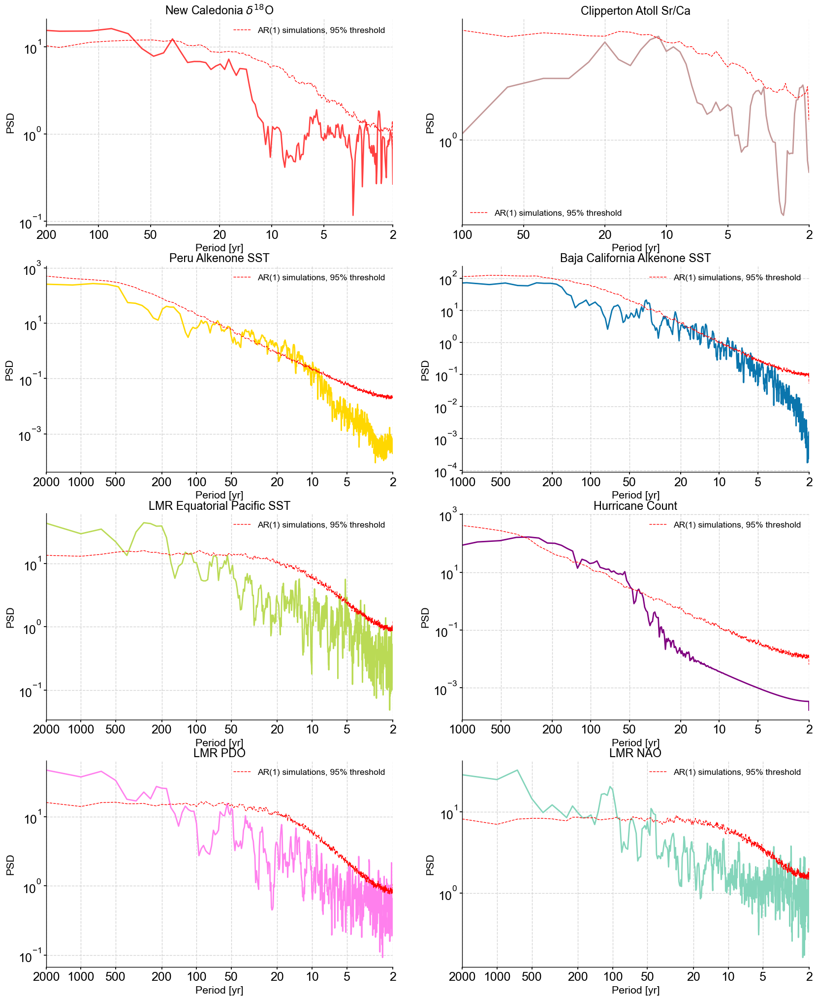

In [633]:
fig, axarr = plt.subplots(nrows = 4, ncols = 2, figsize = [20,25])
axarr = axarr.flatten()

ax = axarr[0]
corald180.detrend().spectral(method='mtm', settings={'NW':3}).signif_test().plot(ax = ax, color = c1)
ax.set_title('New Caledonia $\delta^{18}$O')

ax = axarr[1]
coralSrCa.detrend().spectral(method='mtm', settings={'NW':3}).signif_test().plot(ax = ax, color = c2)
ax.set_title('Clipperton Atoll Sr/Ca')

ax = axarr[2]
SSTperu.detrend().spectral(method='mtm', settings={'NW':3}).signif_test().plot(ax = ax, color = c3)
ax.set_title('Peru Alkenone SST')

ax = axarr[3]
SSTca.detrend().spectral(method='mtm', settings={'NW':3}).signif_test().plot(ax = ax, color = c4)
ax.set_title('Baja California Alkenone SST')

ax = axarr[4]
LMR_SST.detrend().spectral(method='mtm', settings={'NW':3}).signif_test().plot(ax = ax, color = c5)
ax.set_title('LMR Equatorial Pacific SST')

ax = axarr[5]
hurr.detrend().spectral(method='mtm', settings={'NW':3}).signif_test().plot(ax = ax, color = c6)
ax.set_title('Hurricane Count')

ax = axarr[6]
LMR_pdo.detrend().spectral(method='mtm', settings={'NW':3}).signif_test().plot(ax = ax, color = c7)
ax.set_title('LMR PDO')

ax = axarr[7]
LMR_nao.detrend().spectral(method='mtm', settings={'NW':3}).signif_test().plot(ax = ax, color = c8)
ax.set_title('LMR NAO')

## High pass filter for 200 years

Performing spectral analysis on individual series: 100%|██████████| 200/200 [00:01<00:00, 110.11it/s]
Performing spectral analysis on individual series: 100%|██████████| 200/200 [00:00<00:00, 241.01it/s]
Performing spectral analysis on individual series: 100%|██████████| 200/200 [00:11<00:00, 17.01it/s]
Performing spectral analysis on individual series: 100%|██████████| 200/200 [00:09<00:00, 21.00it/s]
Performing spectral analysis on individual series: 100%|██████████| 200/200 [00:09<00:00, 20.89it/s]
Performing spectral analysis on individual series: 100%|██████████| 200/200 [00:07<00:00, 27.92it/s]


Text(0.5, 1.0, 'Hurricane Count')

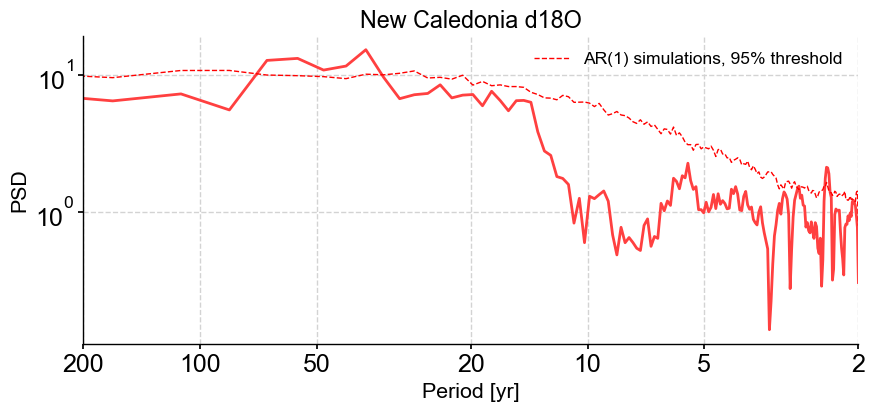

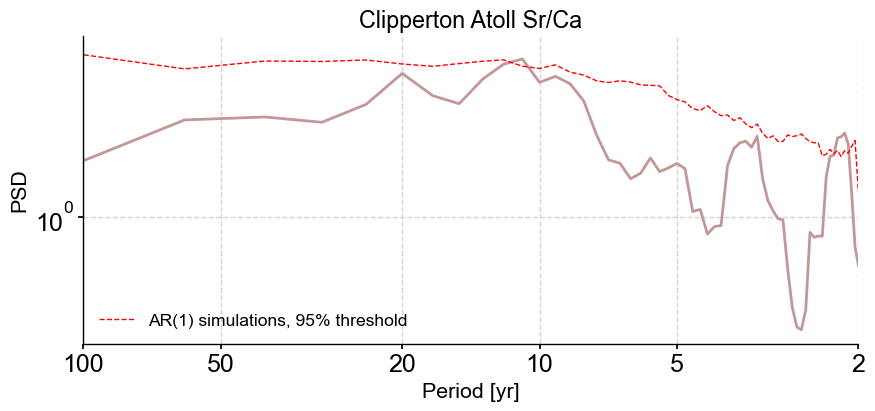

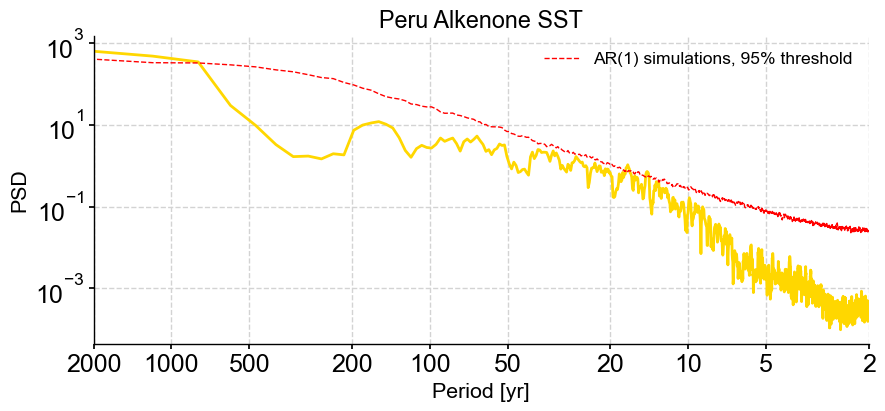

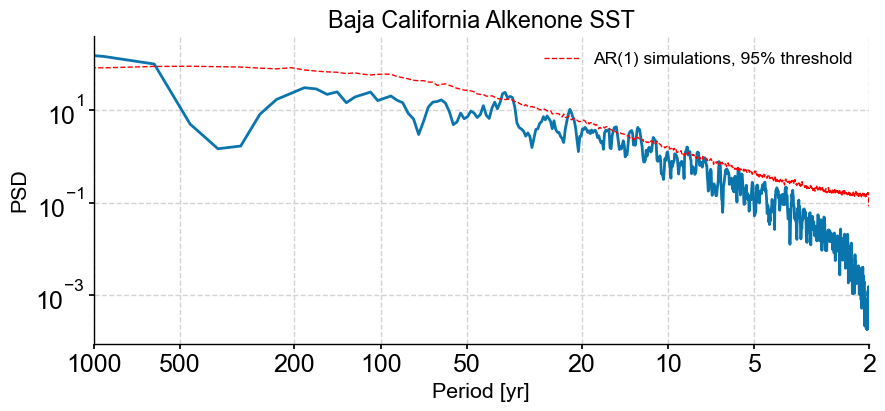

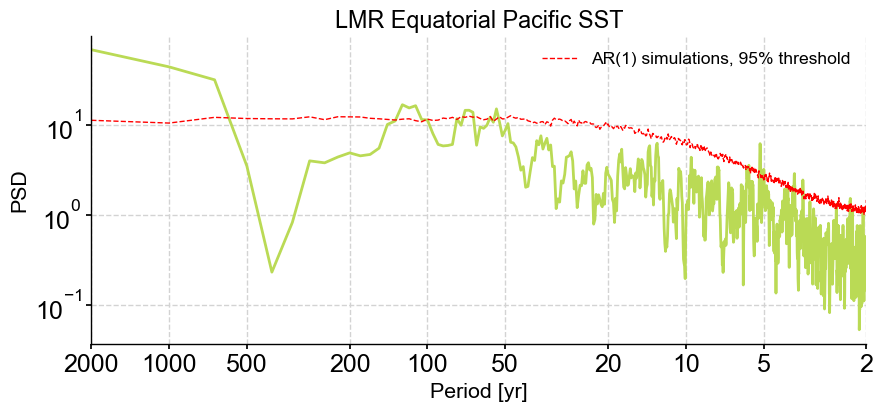

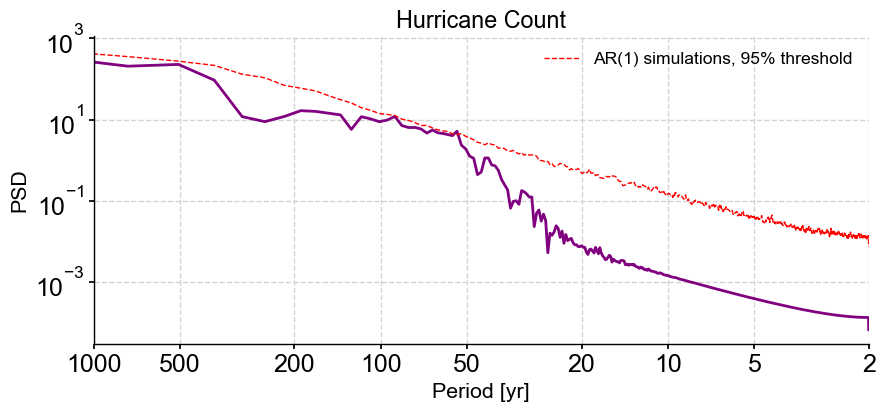

In [625]:
ts_1 = corald180.detrend().copy()
ts_2 = coralSrCa.detrend().copy()
ts_3 = SSTperu.detrend().copy()
ts_4 = SSTca.detrend().copy()
ts_5 = LMR_SST.detrend().copy()
ts_6 = hurr.detrend().copy()
ts_1.value -= corald180.filter(method='lanczos',cutoff_scale=200).value
ts_2.value -= coralSrCa.filter(method='lanczos',cutoff_scale=200).value
ts_3.value -= SSTperu.filter(method='lanczos',cutoff_scale=200).value
ts_4.value -= SSTca.filter(method='lanczos',cutoff_scale=200).value
ts_5.value -= LMR_SST.filter(method='lanczos',cutoff_scale=200).value
ts_6.value -= hurr.filter(method='lanczos',cutoff_scale=200).value

fig, ax = ts_1.spectral(method='mtm', settings={'NW':3}).signif_test().plot(color = c1)
ax.set_title('New Caledonia d18O')
fig,ax = ts_2.spectral(method='mtm', settings={'NW':3}).signif_test().plot(color = c2)
ax.set_title('Clipperton Atoll Sr/Ca')
fig,ax = ts_3.spectral(method='mtm', settings={'NW':3}).signif_test().plot(color = c3)
ax.set_title('Peru Alkenone SST')
fig,ax = ts_4.spectral(method='mtm', settings={'NW':3}).signif_test().plot(color = c4)
ax.set_title('Baja California Alkenone SST')
fig,ax = ts_5.spectral(method='mtm', settings={'NW':3}).signif_test().plot(color = c5)
ax.set_title('LMR Equatorial Pacific SST')
fig,ax = ts_6.spectral(method='mtm', settings={'NW':3}).signif_test().plot(color = c6)
ax.set_title('Hurricane Count')

Performing spectral analysis on individual series: 100%|██████████| 200/200 [00:00<00:00, 708.53it/s]
Performing spectral analysis on individual series: 100%|██████████| 200/200 [00:00<00:00, 749.68it/s]
Performing spectral analysis on individual series: 100%|██████████| 200/200 [00:00<00:00, 729.83it/s]
Performing spectral analysis on individual series: 100%|██████████| 200/200 [00:00<00:00, 754.82it/s]
Performing spectral analysis on individual series: 100%|██████████| 200/200 [00:01<00:00, 105.96it/s]
Performing spectral analysis on individual series: 100%|██████████| 200/200 [00:01<00:00, 108.85it/s]
Performing spectral analysis on individual series: 100%|██████████| 200/200 [00:01<00:00, 107.65it/s]


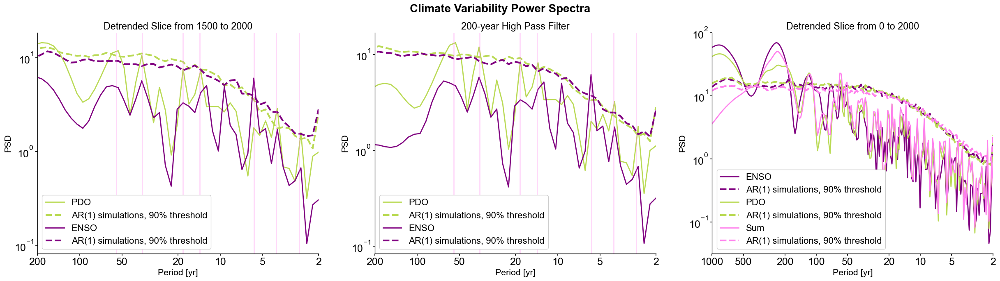

In [577]:
fig, axarr = plt.subplots(ncols = 3, figsize = [30,7])
axarr = axarr.flatten()
lmrnino = LMR_nino.sel(time=slice(1500, 2000))
lmrpdo = LMR_pdo.sel(time=slice(1500, 2000))

ax = axarr[0]
lmrpdo.detrend().spectral(method='lomb_scargle').signif_test(qs = [0.9]).plot(ax = ax, color = c5, signif_clr = c5, signif_linewidth = 3,
                                                                    label = 'PDO')
lmrnino.detrend().spectral(method='lomb_scargle').signif_test(qs = [0.9]).plot(ax = ax, color = c6, signif_clr = c6,signif_linewidth = 3, 
                                                                     label = 'ENSO')
ax.set_title('Detrended Slice from 1500 to 2000')

ax.axvline(x = 5.75, c = c7, alpha = 0.3)
ax.axvline(x = 36, c = c7, alpha = 0.3)
ax.axvline(x = 55, c = c7, alpha = 0.3)
ax.axvline(x = 14, c = c7, alpha = 0.3)
ax.axvline(x = 18.5, c = c7, alpha = 0.3)
ax.axvline(x = 4, c = c7, alpha = 0.3)
ax.axvline(x = 2.75, c = c7, alpha = 0.3)
ax.grid(False)
ax.legend(frameon = 1, fontsize = 16,
                  framealpha = 1, facecolor = 'white')

ax = axarr[1]
ts_1 = lmrpdo.detrend().copy()
ts_1.value -= lmrpdo.detrend().filter(method='lanczos',cutoff_scale=200).value
ts_1.spectral(method='lomb_scargle').signif_test(qs = [0.9]).plot(ax = ax, color = c5, signif_clr = c5, signif_linewidth = 3, label = 'PDO')
ts_2 =  lmrnino.detrend().copy()
ts_2.value -= lmrnino.detrend().filter(method='lanczos',cutoff_scale=200).value
ts_2.spectral(method='lomb_scargle').signif_test(qs = [0.9]).plot(ax = ax, color = c6, signif_clr = c6,signif_linewidth = 3, label = 'ENSO')
ax.set_title('200-year High Pass Filter')
ax.axvline(x = 5.75, c = c7, alpha = 0.3)
ax.axvline(x = 36, c = c7, alpha = 0.3)
ax.axvline(x = 55, c = c7, alpha = 0.3)
ax.axvline(x = 14, c = c7, alpha = 0.3)
ax.axvline(x = 18.5, c = c7, alpha = 0.3)
ax.axvline(x = 4, c = c7, alpha = 0.3)
ax.axvline(x = 2.75, c = c7, alpha = 0.3)
ax.legend(frameon = 1, fontsize = 16,
                  framealpha = 1, facecolor = 'white')
ax.grid(False)

ax = axarr[2]
LMR_nino.detrend().spectral(method='lomb_scargle').signif_test(qs = [0.9]).plot(ax = ax,color = c6, signif_clr = c6, signif_linewidth = 3,
                                                                    label = 'ENSO')
LMR_pdo.detrend().spectral(method='lomb_scargle').signif_test(qs = [0.9]).plot(ax = ax,color = c5, signif_clr = c5, signif_linewidth = 3,
                                                                    label = 'PDO')
NINOPDO.detrend().spectral(method='lomb_scargle').signif_test(qs = [0.9]).plot(ax = ax, color = c7, signif_clr = c7, signif_linewidth = 3,
                                                                    label = 'Sum')
ax.legend(frameon = 1, fontsize = 16,
                  framealpha = 1, facecolor = 'white')
ax.set_title('Detrended Slice from 0 to 2000')

fig.suptitle('Climate Variability Power Spectra', fontsize = 20, fontweight = 'bold')
plt.grid(False)
fig.savefig('/Users/akbaskind/Desktop/Paleo/PDO_ENSO_PSD3.png', bbox_inches='tight')

In [582]:
NTIMES = 1576800
DT = 20
DAY = 86400
(4*NTIMES)+1

6307201

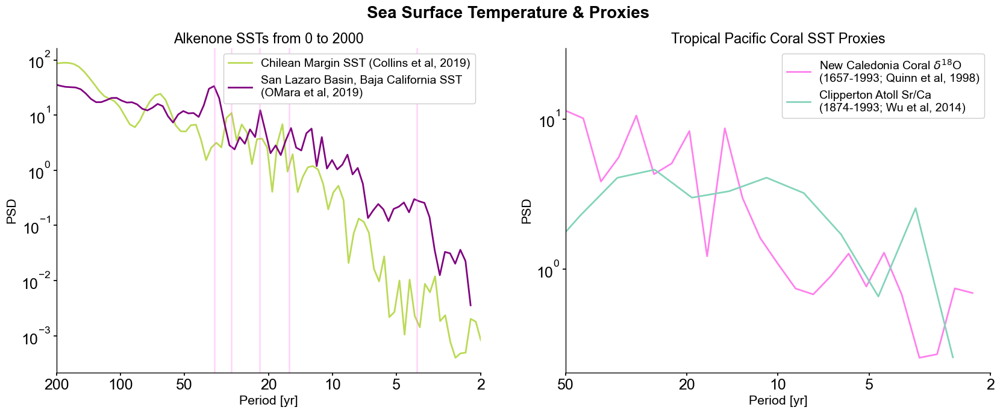

In [601]:
fig, axarr = plt.subplots(ncols = 2, figsize = [20,7])
axarr = axarr.flatten()
sstperu = SSTperu.sel(time=slice(1000, 2000))
sstca = SSTca.sel(time=slice(1000, 2000))

ax = axarr[0]
sstperu.detrend().spectral(method='lomb_scargle').plot(ax = ax, color = c5, 
                                                                    label = 'Chilean Margin SST (Collins et al, 2019)')
sstca.detrend().spectral(method='lomb_scargle').plot(ax = ax, color = c6,  
                                                                     label = 'San Lazaro Basin, Baja California SST \n(OMara et al, 2019)')
ax.set_title('Alkenone SSTs from 0 to 2000')

# ax.axvline(x = 5.75, c = c7, alpha = 0.3)
ax.axvline(x = 36, c = c7, alpha = 0.3)
# ax.axvline(x = 55, c = c7, alpha = 0.3)
ax.axvline(x = 30, c = c7, alpha = 0.3)
ax.axvline(x = 22, c = c7, alpha = 0.3)
ax.axvline(x = 4, c = c7, alpha = 0.3)
ax.axvline(x = 16, c = c7, alpha = 0.3)
# ax.axvline(x = 4, c = c7, alpha = 0.3)
# ax.axvline(x = 2.75, c = c7, alpha = 0.3)
ax.grid(False)
ax.legend(frameon = 1, fontsize = 14,
                  framealpha = 1, facecolor = 'white')

ax = axarr[1]
ts_1 = corald180.detrend().copy()
ts_2 = coralSrCa.detrend().copy()
ts_1.spectral(method='lomb_scargle').plot(ax = ax, color = c7, 
                                                                    label = 'New Caledonia Coral $\delta^{18}$O \n(1657-1993; Quinn et al, 1998)')
ts_2.spectral(method='lomb_scargle').plot(ax = ax, color = c8, 
                                                                     label = 'Clipperton Atoll Sr/Ca \n(1874-1993; Wu et al, 2014)')
ax.set_title('Tropical Pacific Coral SST Proxies')
ax.legend(frameon = 1, fontsize = 14,
                  framealpha = 1, facecolor = 'white')

fig.suptitle('Sea Surface Temperature & Proxies', fontsize = 20, fontweight = 'bold')
plt.grid(False)
# fig.savefig('/Users/akbaskind/Desktop/Paleo/SST_and_proxies_PSD2.png', bbox_inches='tight')

Performing spectral analysis on individual series: 100%|██████████| 200/200 [00:01<00:00, 152.63it/s]
Performing spectral analysis on individual series: 100%|██████████| 200/200 [00:01<00:00, 173.29it/s]


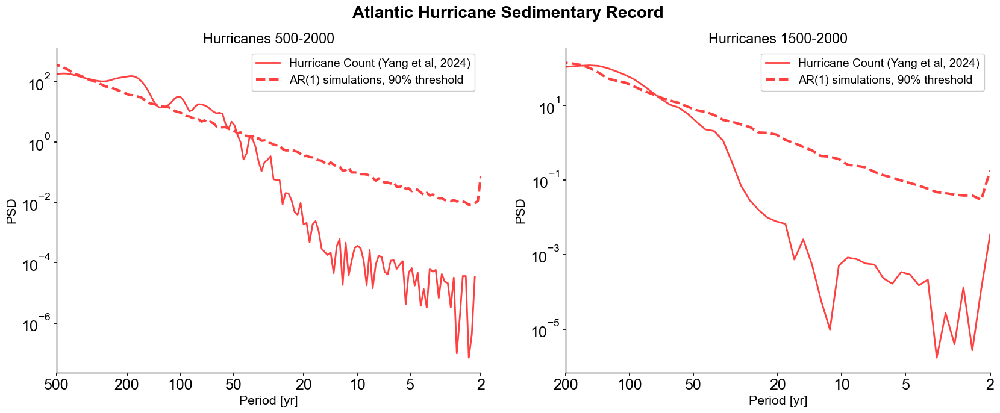

In [225]:
fig, axarr = plt.subplots(ncols = 2, figsize = [20,7])
axarr = axarr.flatten()
Hurr = hurr.sel(time=slice(1500, 2000))

ax = axarr[1]
Hurr.detrend().spectral(method='lomb_scargle').signif_test(qs = [0.9]).plot(ax = ax, color = c1, signif_clr = c1, signif_linewidth = 3,
                                                                    label = 'Hurricane Count (Yang et al, 2024)')

ax.set_title('Hurricanes 1500-2000')

# ax.axvline(x = 5.75, c = c7, alpha = 0.3)
# ax.axvline(x = 36, c = c7, alpha = 0.3)
# ax.axvline(x = 55, c = c7, alpha = 0.3)
# ax.axvline(x = 14, c = c7, alpha = 0.3)
# ax.axvline(x = 18.5, c = c7, alpha = 0.3)
# ax.axvline(x = 4, c = c7, alpha = 0.3)
# ax.axvline(x = 2.75, c = c7, alpha = 0.3)
ax.grid(False)
ax.legend(frameon = 1, fontsize = 14,
                  framealpha = 1, facecolor = 'white')

ax = axarr[0]
hurr.detrend().spectral(method='lomb_scargle').signif_test(qs = [0.9]).plot(ax = ax, color = c1, signif_clr = c1, signif_linewidth = 3,
                                                                    label = 'Hurricane Count (Yang et al, 2024)')
ax.set_title('Hurricanes 500-2000')
ax.legend(frameon = 1, fontsize = 14,
                  framealpha = 1, facecolor = 'white')

fig.suptitle('Atlantic Hurricane Sedimentary Record', fontsize = 20, fontweight = 'bold')
ax.grid(False)
fig.savefig('/Users/akbaskind/Desktop/Paleo/hurricane_PSD.png', bbox_inches='tight')

# Hurricane data
Github: https://github.com/wy2136/LastMillenniumHurricanes/tree/v1.0.0?tab=readme-ov-file
Paper: https://www.nature.com/articles/s41467-024-45112-6#Sec8

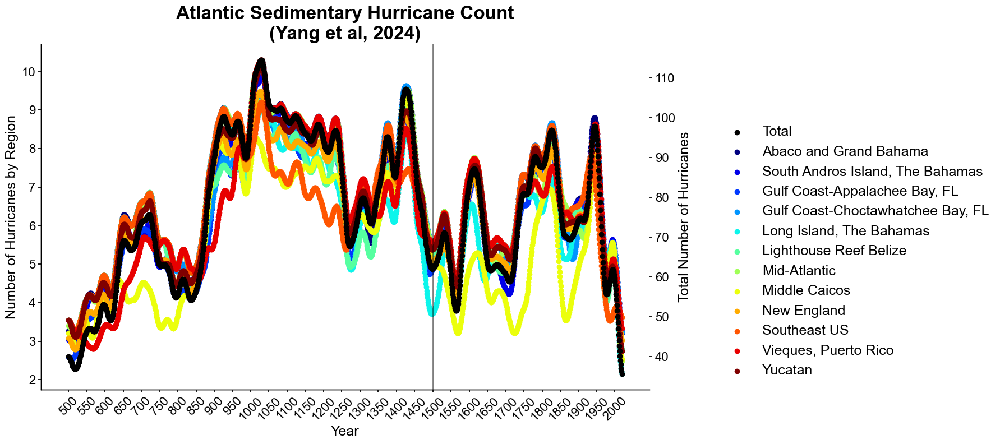

In [307]:
total_hurricane = hu['sedimentHUcount'].isel(member = slice(3,15)).sum('member')
y1 = hu['sedimentHUcount'].isel(member = 3)
y2 = hu['sedimentHUcount'].isel(member = 4)
y3 = hu['sedimentHUcount'].isel(member = 5)
y4 = hu['sedimentHUcount'].isel(member = 6)
y5 = hu['sedimentHUcount'].isel(member = 7)
y6 = hu['sedimentHUcount'].isel(member = 8)
y7 = hu['sedimentHUcount'].isel(member = 9)
y8 = hu['sedimentHUcount'].isel(member = 10)
y9 = hu['sedimentHUcount'].isel(member = 11)
y10 = hu['sedimentHUcount'].isel(member = 12)
y11 = hu['sedimentHUcount'].isel(member = 13)
y12 = hu['sedimentHUcount'].isel(member = 14)
labs = hu['member'].isel(member = slice(3,15))
labs = ['Abaco and Grand Bahama ', 'South Andros Island, The Bahamas', 'Gulf Coast-Appalachee Bay, FL', 'Gulf Coast-Choctawhatchee Bay, FL',
        'Long Island, The Bahamas', 'Lighthouse Reef Belize', 'Mid-Atlantic', 'Middle Caicos', 'New England', 'Southeast US', 
        'Vieques, Puerto Rico', 'Yucatan']

fig,ax = plt.subplots(figsize = [14,8])
plt.rcParams["axes.prop_cycle"] = plt.cycler("color", plt.cm.hsv(np.linspace(0,1,12)))
colors = plt.rcParams["axes.prop_cycle"]()

# Hurricanes by region
ax.scatter(hu['year'],y12, color = 'k', label = 'Total', zorder = 1)
ax.scatter(hu['year'],y1, label = labs[0])
ax.scatter(hu['year'],y2, label = labs[1])
ax.scatter(hu['year'],y3, label = labs[2])
ax.scatter(hu['year'],y4, label = labs[3])
ax.scatter(hu['year'],y5, label = labs[4])
ax.scatter(hu['year'],y6, label = labs[5])
ax.scatter(hu['year'],y7, label = labs[6])
ax.scatter(hu['year'],y8, label = labs[7])
ax.scatter(hu['year'],y9, label = labs[8])
ax.scatter(hu['year'],y10, label = labs[9])
ax.scatter(hu['year'],y11, label = labs[10])
ax.scatter(hu['year'],y12, label = labs[11])

# Total hurricanes
ax2 = ax.twinx()
ax2.scatter(hu['year'], total_hurricane, color = 'k', label = 'Total')

# Formatting
FS = 18
fs = 16
ax.legend(bbox_to_anchor=(1.1,0.8), fontsize = FS)
ax.set_ylabel('Number of Hurricanes by Region', fontsize = FS)
ax2.set_ylabel('Total Number of Hurricanes', fontsize = FS)
ax.set_xlabel('Year', fontsize = FS)
ax.tick_params('x', labelsize = fs, labelrotation = 45)
ax.tick_params('y', labelsize = fs)
ax2.tick_params('y', labelsize = fs)
ax.set_xticks(np.arange(min(hu['year']), max(hu['year'])+1, 50))
ax.xaxis.grid()
ax.axvline(1500, c = 'k', alpha = 0.5)
ax.yaxis.grid(False)
ax2.yaxis.grid(False)
ax.set_title('Atlantic Sedimentary Hurricane Count\n(Yang et al, 2024)', fontsize = FS + 6, fontweight = 'bold')
fig.savefig('/Users/akbaskind/Desktop/Paleo/hurricane_ts.png', bbox_inches='tight')

## Hurrican spectral analysis with PyleoClim

In [52]:
hurr = pyleo.Series(time=hu['year'], value=total_hurricane,
                      time_name='Year', time_unit='yr', verbose=False,
                      value_name='Hurricane Count', value_unit='no.')

Performing spectral analysis on individual series: 100%|██████████| 200/200 [00:07<00:00, 27.03it/s]


Text(0.5, 1.0, 'Total Hurricane Count')

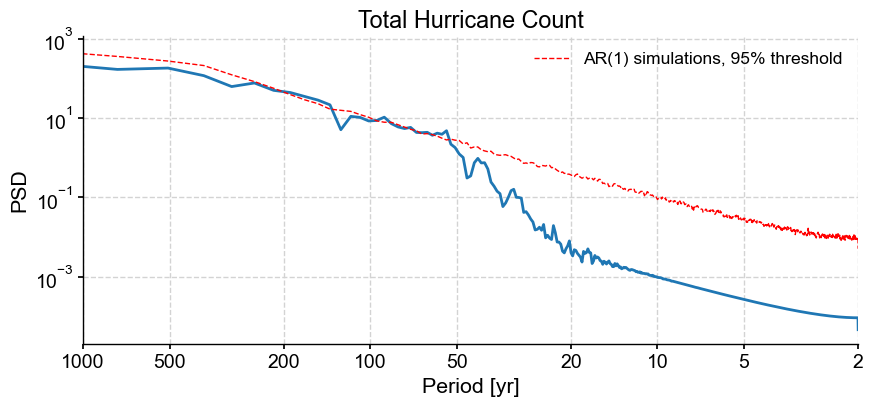

In [112]:
fig, ax = hurr.spectral(method='mtm', settings={'NW':3}).signif_test().plot()
ax.set_title('Total Hurricane Count')

### Apply high pass filter

<AxesSubplot:xlabel='Time [yr]', ylabel='Hurricane Count [no.]'>

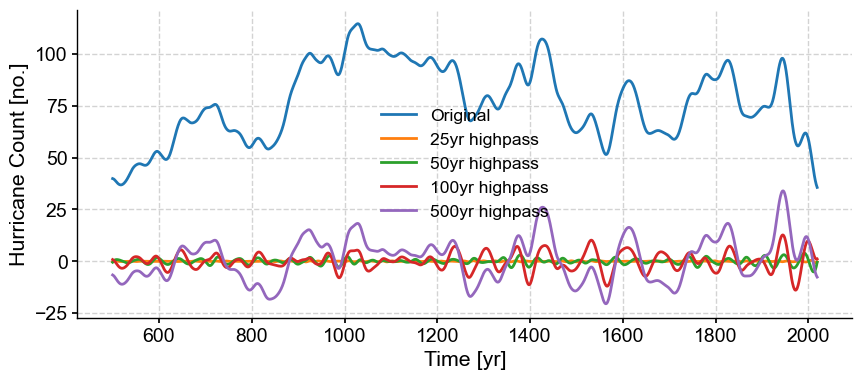

In [140]:
# ts_low = hurr.filter(method='lanczos',cutoff_scale=500)
ts_25 = hurr.copy()
ts_50 = hurr.copy()
ts_100 = hurr.copy()
ts_500 = hurr.copy()
ts_25.value -= hurr.filter(method='lanczos',cutoff_scale=25).value
ts_50.value -= hurr.filter(method='lanczos',cutoff_scale=50).value
ts_100.value -= hurr.filter(method='lanczos',cutoff_scale=100).value
ts_500.value -= hurr.filter(method='lanczos',cutoff_scale=500).value
fig, ax = hurr.plot(label='Original')
ts_25.plot(label='25yr highpass',ax=ax)
ts_50.plot(label='50yr highpass',ax=ax)
ts_100.plot(label='100yr highpass',ax=ax)
ts_500.plot(label='500yr highpass',ax=ax)

Performing spectral analysis on individual series: 100%|██████████| 200/200 [00:09<00:00, 20.45it/s]
Performing spectral analysis on individual series: 100%|██████████| 200/200 [00:09<00:00, 20.73it/s]
Performing spectral analysis on individual series: 100%|██████████| 200/200 [00:09<00:00, 20.42it/s]
Performing spectral analysis on individual series: 100%|██████████| 200/200 [00:10<00:00, 19.88it/s]


<AxesSubplot:xlabel='Period [yr]', ylabel='PSD'>

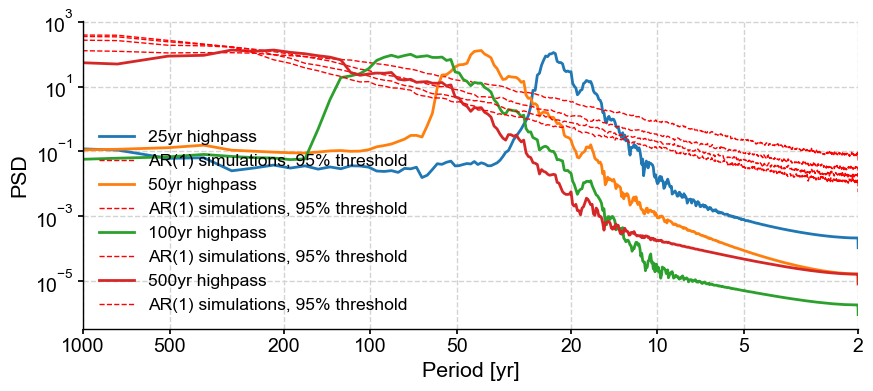

In [141]:
fig, ax = ts_25.spectral(method='mtm').signif_test().plot(label='25yr highpass')
ts_50.spectral(method='mtm').signif_test().plot(ax = ax,label='50yr highpass')
ts_100.spectral(method='mtm').signif_test().plot(ax = ax,label='100yr highpass')
ts_500.spectral(method='mtm').signif_test().plot(ax = ax,label='500yr highpass')

## SSA

In [117]:
nino_mcssa

(<Figure size 600x400 with 1 Axes>,
 <AxesSubplot:title={'center':'SSA scree plot'}, xlabel='Mode index $i$', ylabel='$\\lambda_i$'>)

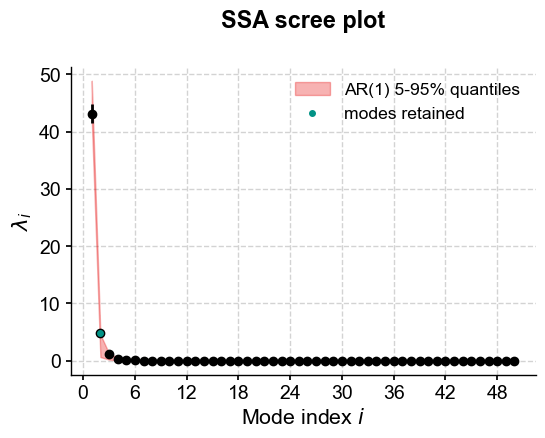

In [125]:
nino_mcssa = hurr.ssa(M = 50, nMC=1000)
nino_mcssa.screeplot()

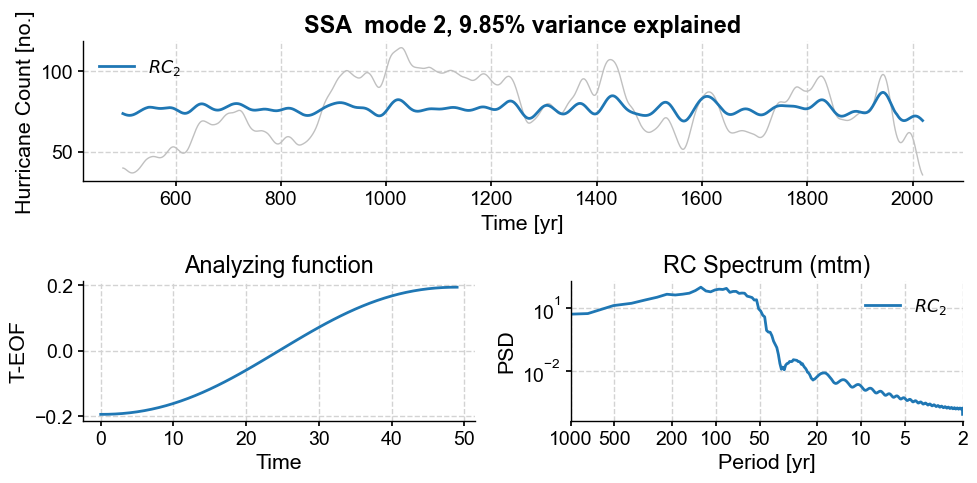

In [139]:
fig,ax=nino_mcssa.modeplot(index=1)

(<Figure size 1000x400 with 1 Axes>,
 <AxesSubplot:xlabel='Time [yr]', ylabel='Hurricane Count [no.]'>)

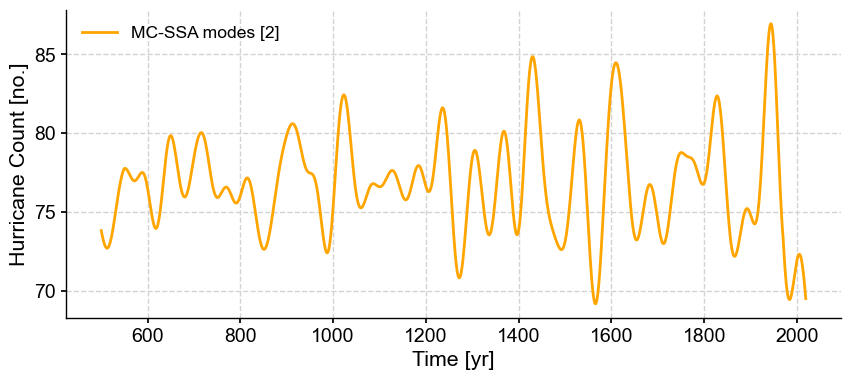

In [135]:
nino_mcssa.RCseries.plot(label='MC-SSA modes '+str(nino_mcssa.mode_idx+1),color='orange')

# SST

https://doi.pangaea.de/10.1594/PANGAEA.909404?format=html#download

O'Mara, Nicholas A; Cheung, Anson H; Kelly, Christopher S; Sandwick, Samantha; Herbert, Timothy D; Russell, James M; Abella-Gutiérrez, Jose; Dee, Sylvia G; Swarzenski, Peter W; Herguera, Juan-Carlos (2019): An 1800-year alkenone-based reconstruction of sea surface temperature from the San Lazaro (Soledad) Basin Baja California, Mexico [dataset]. PANGAEA, https://doi.org/10.1594/PANGAEA.909404, Supplement to: O'Mara, Nicholas A; Cheung, Anson H; Kelly, Christopher S; Sandwick, Samantha; Herbert, Timothy D; Russell, James M; Abella-Gutiérrez, Jose; Dee, Sylvia G; Swarzenski, Peter W; Herguera, Juan Carlos (2019): Subtropical Pacific Ocean Temperature Fluctuations in the Common Era: Multidecadal Variability and Its Relationship With Southwestern North American Megadroughts. Geophysical Research Letters, 46(24), 14662-14673, https://doi.org/10.1029/2019GL084828

In [60]:
sst = pd.read_csv('/Users/akbaskind/Desktop/Paleo/OMara2019SST.csv')
sst

,Depth sed [m],Depth top [m],Depth bot [m],Age [a AD/CE],Age [ka BP],UK'37,SST (1-12) [¬∞C]
0,0.001,0.000,0.002,1990.0,-0.0400,0.754,21.51
1,0.003,0.002,0.004,1989.4,-0.0394,0.746,21.26
2,0.005,0.004,0.006,1988.8,-0.0388,0.744,21.20
3,0.007,0.006,0.008,1988.2,-0.0382,0.756,21.56
4,0.009,0.008,0.010,1987.6,-0.0376,0.748,21.32
...,...,...,...,...,...,...,...
946,1.918,1.917,1.919,153.3,1.7967,0.739,21.05
947,1.920,1.919,1.921,151.1,1.7989,0.739,21.07
948,1.922,1.921,1.923,149.0,1.8010,0.742,21.16
949,1.924,1.923,1.925,147.0,1.8030,0.745,21.23


## SST spectral analysis with pyleoclim

In [70]:
SST = pyleo.Series(time=sst['Age [a AD/CE]'], value=sst['SST (1-12) [¬∞C]'],
                      time_name='Year', time_unit='yr', verbose=False,
                      value_name='SST', value_unit='°C')
SST = SST.interp(step = 1)

Performing spectral analysis on individual series: 100%|██████████| 200/200 [00:08<00:00, 22.67it/s]


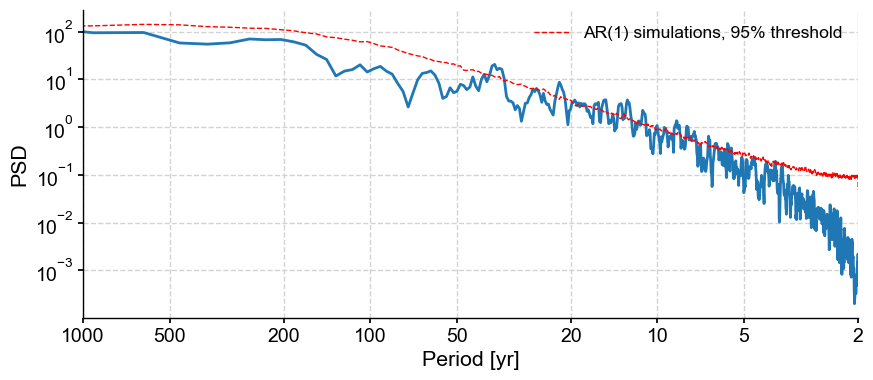

In [142]:
fig, ax = SST.spectral(method='mtm', settings={'NW':3}).signif_test().plot()


<AxesSubplot:xlabel='Time [yr]', ylabel='SST [°C]'>

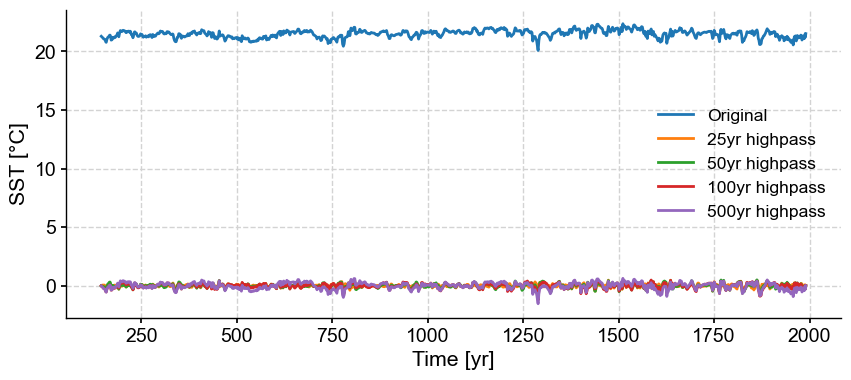

In [149]:
ts_25 = SST.copy()
ts_50 = SST.copy()
ts_100 = SST.copy()
ts_500 = SST.copy()
ts_25.value -= SST.filter(method='lanczos',cutoff_scale=25).value
ts_50.value -= SST.filter(method='lanczos',cutoff_scale=50).value
ts_100.value -= SST.filter(method='lanczos',cutoff_scale=100).value
ts_500.value -= SST.filter(method='lanczos',cutoff_scale=500).value
fig, ax = SST.plot(label='Original')
ts_25.plot(label='25yr highpass',ax=ax)
ts_50.plot(label='50yr highpass',ax=ax)
ts_100.plot(label='100yr highpass',ax=ax)
ts_500.plot(label='500yr highpass',ax=ax)

Performing spectral analysis on individual series: 100%|██████████| 200/200 [00:11<00:00, 16.80it/s]
Performing spectral analysis on individual series: 100%|██████████| 200/200 [00:11<00:00, 16.83it/s]
Performing spectral analysis on individual series: 100%|██████████| 200/200 [00:11<00:00, 16.71it/s]
Performing spectral analysis on individual series: 100%|██████████| 200/200 [00:12<00:00, 16.15it/s]


<AxesSubplot:xlabel='Period [yr]', ylabel='PSD'>

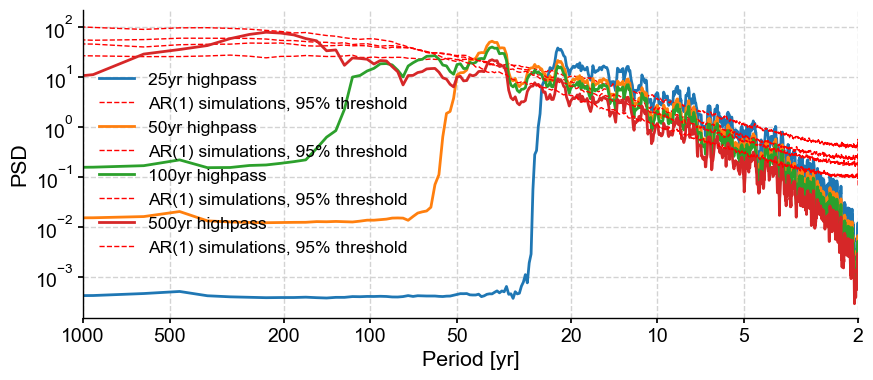

In [152]:
fig, ax = ts_25.spectral(method='mtm').signif_test().plot(label='25yr highpass')
ts_50.spectral(method='mtm').signif_test().plot(ax = ax,label='50yr highpass')
ts_100.spectral(method='mtm').signif_test().plot(ax = ax,label='100yr highpass')
ts_500.spectral(method='mtm').signif_test().plot(ax = ax,label='500yr highpass')

# Time series of hurricanes and SST

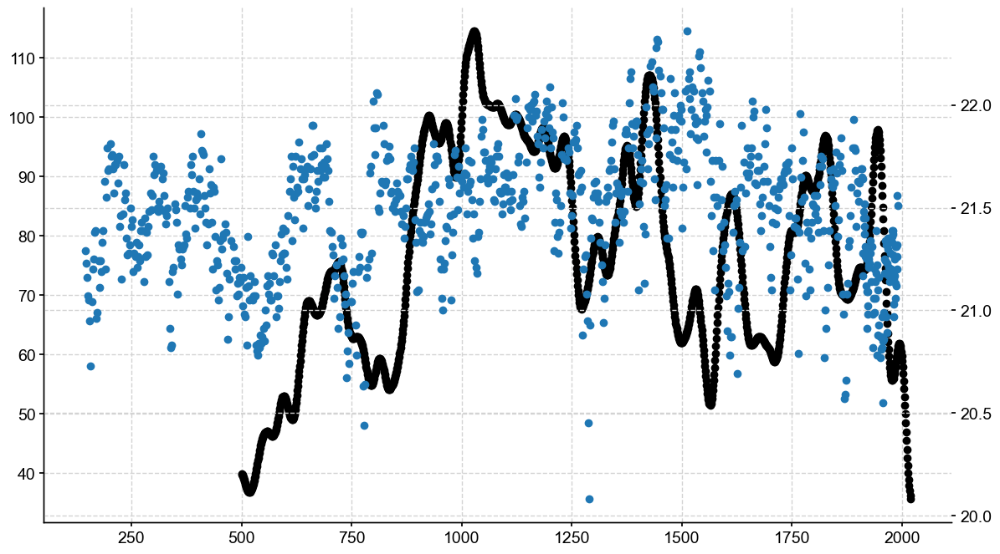

In [148]:
fig,ax = plt.subplots(figsize = [14,8])
ax.scatter(hu['year'], total_hurricane, color = 'k', label = 'Total')
ax2 = ax.twinx()
ax2.scatter(sst['Age [a AD/CE]'], sst['SST (1-12) [¬∞C]'])


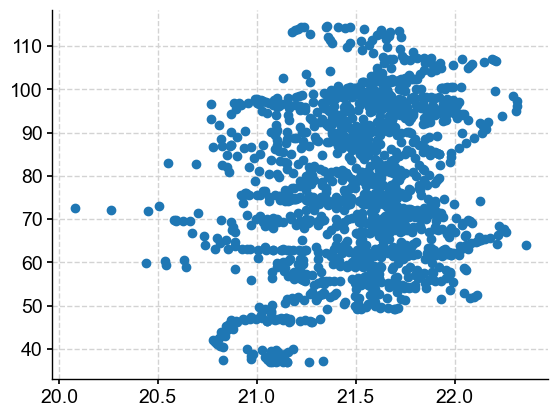

In [186]:
plt.scatter(temp['SST'], HURR['Hurricane'])

In [176]:
SST.value

array([21.29, 21.26, 21.23, ..., 21.48, 21.22, 21.51])

In [200]:
temp = {'Year': sst['Age [a AD/CE]'], 'Value': sst['SST (1-12) [¬∞C]'], 'data': 'sst'}
temp = pd.DataFrame(temp)
temp = temp[temp['Year'] >= 500]

In [201]:
HURR = {'Year': hurr.time, 'Value': hurr.value, 'data': 'hurricane'}
HURR = pd.DataFrame(HURR)
HURR = HURR[HURR['Year'] < 1991]

In [203]:
comb = pd.concat([temp, HURR])
comb = comb.sort_values(by=['Year'])

In [205]:
series_tmp = pyleo.Series(time=comb['Year'],
                          value=comb['Value'],
                          time_name='Years',
                          time_unit='yr',
                          value_name=comb['data'],
                          value_unit=comb['data'],
                          label = comb['data'])

Time axis values sorted in ascending order


In [215]:
TS = []
TS.append(SST)
TS.append(hurr)

In [230]:
ms = pyleo.MultipleSeries(TS, label='Hurricanes and SST', time_unit='year CE')

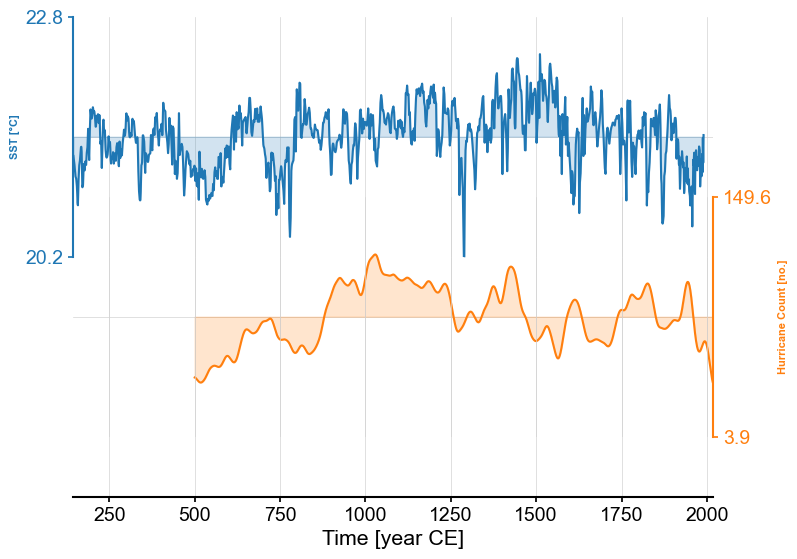

In [231]:
fig, ax = ms.stackplot()

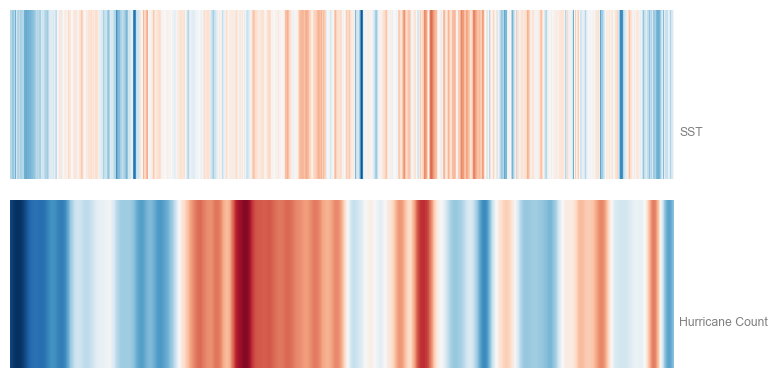

In [232]:
fig,ax = ms.stripes(ref_period=(1000,2000), figsize=(8,4))

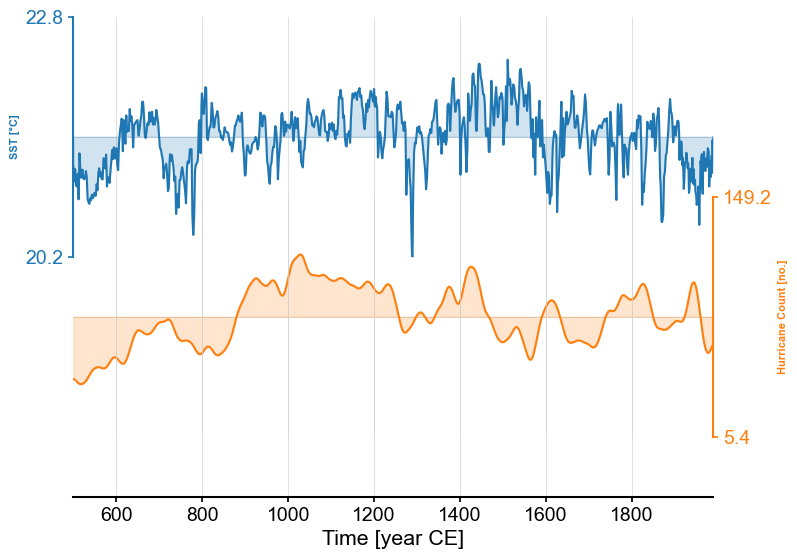

In [233]:
combo_ct = ms.common_time()
fig, ax = combo_ct.stackplot()

Performing spectral analysis on individual series: 100%|██████████| 2/2 [00:00<00:00, 92.70it/s]


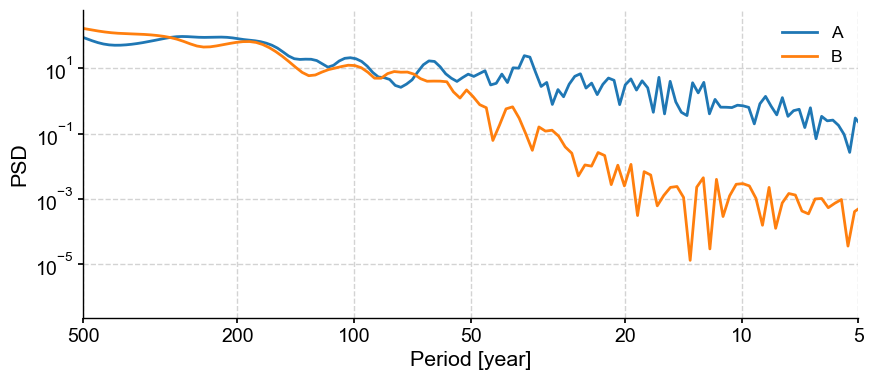

In [241]:
fig, ax = ms.spectral().plot()
ax.legend(['A','B'])

In [247]:
corrMS = SST.correlation(hurr,settings={'method':'isospectral','nsim':1000},seed=333)
print(corrMS)

  correlation    p-value  signif. (α: 0.05)
-------------  ---------  -------------------
     0.239268       0.33  False



In [250]:
df = xr.open_dataset("/Users/akbaskind/Desktop/Paleo/sst_MCruns_ensemble_mean_LMRv2.1.nc")
df

<xarray.Dataset>
Dimensions:  (time: 2001, lat: 91, lon: 180, MCrun: 20)
Coordinates:
  * time     (time) object 0000-01-01 00:00:00 ... 2000-01-01 00:00:00
  * lat      (lat) float32 -90.0 -88.0 -86.0 -84.0 -82.0 ... 84.0 86.0 88.0 90.0
  * lon      (lon) float32 0.0 2.0 4.0 6.0 8.0 ... 350.0 352.0 354.0 356.0 358.0
Dimensions without coordinates: MCrun
Data variables:
    sst      (time, MCrun, lat, lon) float32 ...
Attributes:
    description:  Last Millennium Reanalysis climate field reconstruction for...
    experiment:   productionFinal2_gisgpcc_ccms4_LMRdbv1.1.0_tos
    comment:      File contains ensemble-mean values for each Monte-Carlo rec...

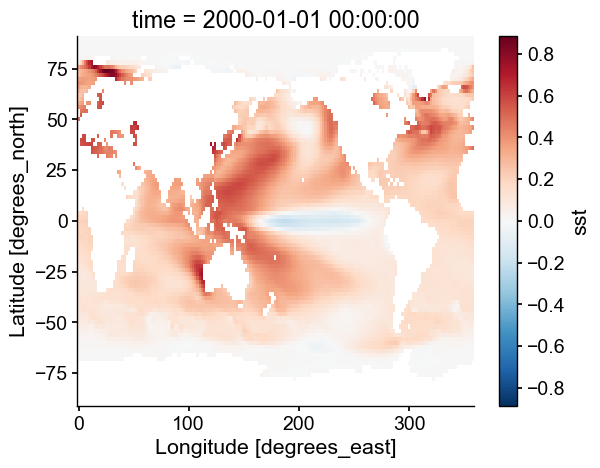

In [256]:
df['sst'].isel(time = 2000).mean('MCrun').plot()

In [257]:
x1 = 190
x2 = 240
y1 = -5
y2 = 5

<xarray.DataArray 'lon' (lon: 180)>
array([  0.,   2.,   4.,   6.,   8.,  10.,  12.,  14.,  16.,  18.,  20.,  22.,
        24.,  26.,  28.,  30.,  32.,  34.,  36.,  38.,  40.,  42.,  44.,  46.,
        48.,  50.,  52.,  54.,  56.,  58.,  60.,  62.,  64.,  66.,  68.,  70.,
        72.,  74.,  76.,  78.,  80.,  82.,  84.,  86.,  88.,  90.,  92.,  94.,
        96.,  98., 100., 102., 104., 106., 108., 110., 112., 114., 116., 118.,
       120., 122., 124., 126., 128., 130., 132., 134., 136., 138., 140., 142.,
       144., 146., 148., 150., 152., 154., 156., 158., 160., 162., 164., 166.,
       168., 170., 172., 174., 176., 178., 180., 182., 184., 186., 188., 190.,
       192., 194., 196., 198., 200., 202., 204., 206., 208., 210., 212., 214.,
       216., 218., 220., 222., 224., 226., 228., 230., 232., 234., 236., 238.,
       240., 242., 244., 246., 248., 250., 252., 254., 256., 258., 260., 262.,
       264., 266., 268., 270., 272., 274., 276., 278., 280., 282., 284., 286.,
       288., 290., 292., 294., 296., 298., 300., 302., 304., 306., 308., 310.,
       312., 314., 316., 318., 320., 322., 324., 326., 328., 330., 332., 334.,
       336., 338., 340., 342., 344., 346., 348., 350., 352., 354., 356., 358.],
      dtype=float32)
Coordinates:
  * lon      (lon) float32 0.0 2.0 4.0 6.0 8.0 ... 350.0 352.0 354.0 356.0 358.0
Attributes:
    description:         longitude
    units:               degrees_east
    long_name:           Longitude
    standard_name:       longitude
    axis:                X
    coordinate_defines:  point
    actual_range:        [  0. 358.]

In [258]:
df.lat

<xarray.DataArray 'lat' (lat: 91)>
array([-90., -88., -86., -84., -82., -80., -78., -76., -74., -72., -70., -68.,
       -66., -64., -62., -60., -58., -56., -54., -52., -50., -48., -46., -44.,
       -42., -40., -38., -36., -34., -32., -30., -28., -26., -24., -22., -20.,
       -18., -16., -14., -12., -10.,  -8.,  -6.,  -4.,  -2.,   0.,   2.,   4.,
         6.,   8.,  10.,  12.,  14.,  16.,  18.,  20.,  22.,  24.,  26.,  28.,
        30.,  32.,  34.,  36.,  38.,  40.,  42.,  44.,  46.,  48.,  50.,  52.,
        54.,  56.,  58.,  60.,  62.,  64.,  66.,  68.,  70.,  72.,  74.,  76.,
        78.,  80.,  82.,  84.,  86.,  88.,  90.], dtype=float32)
Coordinates:
  * lat      (lat) float32 -90.0 -88.0 -86.0 -84.0 -82.0 ... 84.0 86.0 88.0 90.0
Attributes:
    description:         latitude
    units:               degrees_north
    long_name:           Latitude
    standard_name:       latitude
    axis:                Y
    coordinate_defines:  point
    actual_range:        [-90.  90.]

# LMR data

In [308]:
lmr = pd.read_csv('/Users/akbaskind/Desktop/Paleo/LMRdata.csv')
lmr

,archive type,lat (°),long (°),proxy
0,lake sediment,-6.03,28.53,TEX86
1,lake sediment,-10.00,34.29,TEX86
2,speleothem,-24.02,29.11,d18O
3,glacier ice,-72.80,159.06,dD
4,glacier ice,-66.77,112.81,d18O
...,...,...,...,...
687,tree,-39.33,-71.25,TRW
688,glacier ice,-13.93,-70.83,d18O
689,tree,-41.17,-71.92,TRW
690,lake sediment,-32.27,-70.50,reflectance


In [312]:
groups = lmr.groupby('proxy')
groups.keys()

TypeError: 'str' object is not callable

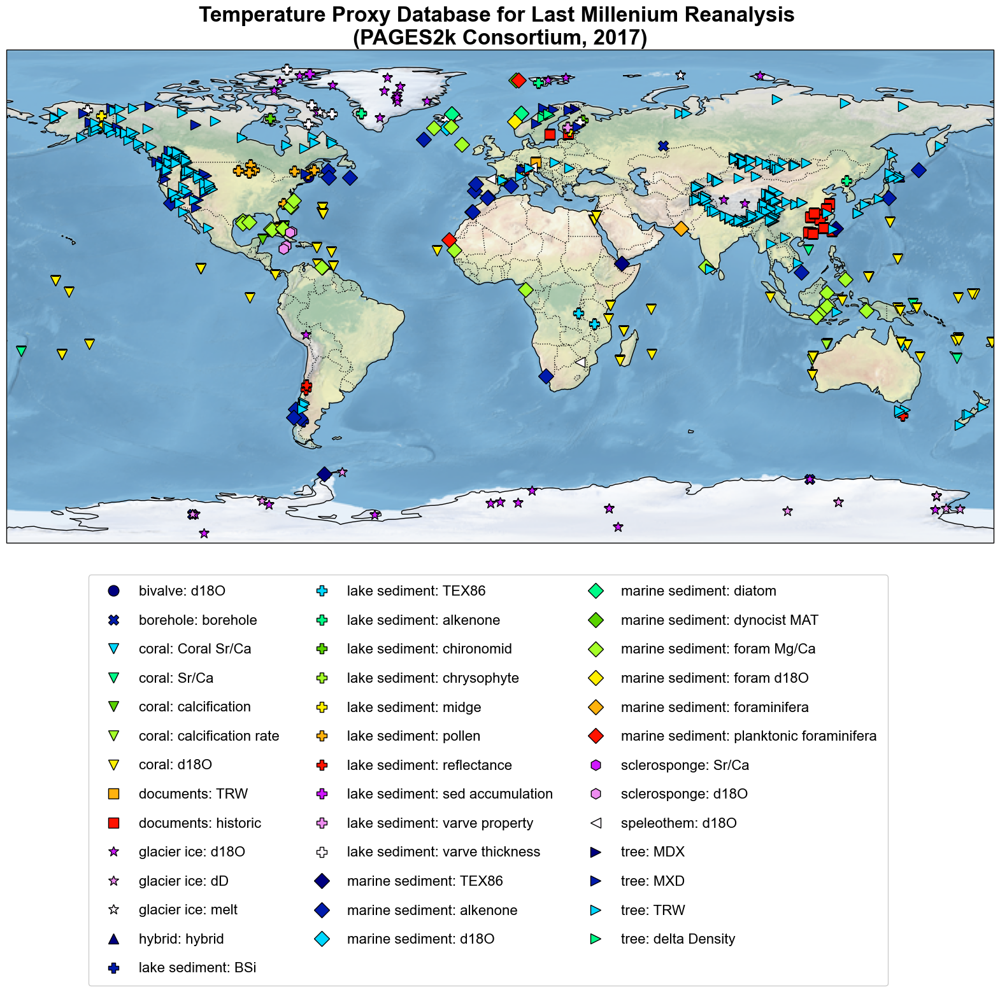

In [343]:
fig, ax = plt.subplots(figsize = [20,15],subplot_kw={'projection':ccrs.PlateCarree()})

import matplotlib.patches as mpatches

plt.rcParams["axes.prop_cycle"] = plt.cycler("color", plt.cm.gist_ncar(np.linspace(0,1,12)))
colors = plt.rcParams["axes.prop_cycle"]()
# ax.coastlines()
ax.set_extent([-180, 180, -90, 90], crs=ccrs.PlateCarree())
groups = lmr.groupby('archive type')
for name, group in groups:
    if name == 'bivalve':
        m = 'o'
    elif name == 'borehole':
        m = 'X'
    elif name == 'coral':
        m = 'v'
    elif name == 'documents':
        m = 's'
    elif name == 'glacier ice':
        m = '*'
    elif name == 'hybrid':
        m = '^'
    elif name == 'lake sediment':
        m = 'P'
    elif name == 'marine sediment':
        m = 'D'
    elif name == 'sclerosponge':
        m = 'h'
    elif name == 'speleothem':
        m = '<'
    else:
        m = '>'
    group2 = group.groupby('proxy')
    for name2, group3 in group2:
        c = next(colors)["color"]
        ax.plot(group3['long (°)'], group3['lat (°)'], marker=m, linestyle='', ms=12, markerfacecolor = c, markeredgecolor = 'k',label=name + ': ' + name2)


ax.add_feature(cfeature.LAND)
ax.add_feature(cfeature.OCEAN)
ax.add_feature(cfeature.BORDERS, linestyle=':')
ax.add_feature(cfeature.COASTLINE, zorder = 1)
ax.stock_img()
ax.set_title('Temperature Proxy Database for Last Millenium Reanalysis \n(PAGES2k Consortium, 2017)', fontsize = 24, fontweight = 'bold')

legend = ax.legend(loc = 'upper right', frameon = 1,labelspacing = 1.15, borderpad = 0.75, fontsize = 16,
                  framealpha = 1, facecolor = 'white', ncol = 3, bbox_to_anchor=(0.9,-0.05))
# frame = legend.get_frame()
# frame.set_color('white')

plt.show()
fig.savefig('/Users/akbaskind/Desktop/Paleo/map_LMR.png', bbox_inches='tight')

In [323]:
group


,archive type,lat (°),long (°),proxy
31,tree,72.00,101.00,TRW
34,tree,61.03,-146.59,TRW
35,tree,67.90,-140.70,TRW
38,tree,69.50,147.00,TRW
42,tree,70.67,125.87,TRW
...,...,...,...,...
520,tree,41.40,-106.20,MXD
685,tree,-40.10,-72.05,TRW
686,tree,-38.50,-71.50,TRW
687,tree,-39.33,-71.25,TRW
